In [1]:
run_gridsearch = False
hyperparam_csv_file = "calpella_daily_hyperparams.csv"

In [2]:
import sys
import os
import itertools
import pandas as pd
current_dir = os.getcwd()
print(current_dir)

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all


In [3]:
library_path = os.path.join('..', '..', '..','..','UCB-USACE-LSTMs')
sys.path.insert(0, library_path)
print(sys.path)

['../../../../UCB-USACE-LSTMs', '/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all', '/Users/canruso/Desktop', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python310.zip', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10/lib-dynload', '', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10/site-packages', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10/site-packages/setuptools/_vendor']


In [4]:
from pathlib import Path
from neuralhydrology.evaluation.metrics import *
from UCB_training.UCB_train import UCB_trainer
from UCB_training.UCB_utils import combinedPlot
from UCB_training.UCB_utils import fancyCombinedPlot

In [5]:
current_path = os.getcwd()
library_path = current_path.split('UCB-USACE-LSTMs')[0] + 'UCB-USACE-LSTMs'

target_path = os.path.join(library_path, 'UCB_training', 'models', 'calpella_all')

if os.path.exists(target_path):
    os.chdir(target_path)
    print("Current Working Directory:", os.getcwd())
    print("Train Basin File Exists:", os.path.exists("calpella")) 
else:
    print(f"Error: The target path '{target_path}' does not exist.")

Current Working Directory: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all
Train Basin File Exists: True


In [6]:
path_to_csv = Path(library_path +'/russian_river_data')
path_to_yaml = Path("calpella_gage_nlayer.yaml")
path_to_physics_data = Path(library_path + "/russian_river_data/Calpella_daily.csv")

In [7]:
features_with_physics = [
    #from hourly
    "EF RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "EF RUSSIAN 20 PRECIP-INC SCREENED",
    "POTTER VALLEY CA FLOW USGS_ADJUSTED",
    "UKIAH CA HUMIDITY USAF-NOAA",
    "UKIAH CA SOLAR RADIATION USAF-NOAA",
    "UKIAH CA TEMPERATURE USAF-NOAA",
    "UKIAH CA WINDSPEED USAF-NOAA",
    #from new capella.csv
    'Capella Gage FLOW',
    'EF Russian 20 ET-POTENTIAL',
    'EF Russian 20 FLOW',
    'EF Russian 20 FLOW-BASE',
    'EF Russian 20 INFILTRATION',
    'EF Russian 20 PERC-SOIL',
    'EF Russian 20 SATURATION FRACTION',
    #    'Lake Mendocino Storage',
]

In [8]:
hyperparam_space = {
    "hidden_size": [64, 128, 256],
    "seq_length": [90, 180],
    "num_layers": [1, 2],
    "epochs": [16, 32]
}
fixed_dropout = 0.4
no_physics_results = []
physics_results = []

NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:00:57,770: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190057/output.log initialized.
2025-02-16 19:00:57,770: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190057
2025-02-16 19:00:57,770: ### Run configurations for testing_run
2025-02-16 19:00:57,770: experiment_name: testing_run
2025-02-16 19:00:57,771: train_basin_file: calpella
2025-02-16 19:00:57,771: validation_basin_file: calpella
2025-02-16 19:00:57,771: test_basin_file: calpella
2025-02-16 19:00:57,772: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:00:57,772: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:00:57,772: validation_start_date: 2002-10-01 00:00:00
2025-02-16 19:00:57,772: validation_end_date: 2005-09-30 00:00:00
2025-02-16 19:00:57,773: test_start_date: 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]
2025-02-16 19:01:11,892: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190057/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:01:11,893: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190057/validation/model_epoch016/validation_results.p
got predictions


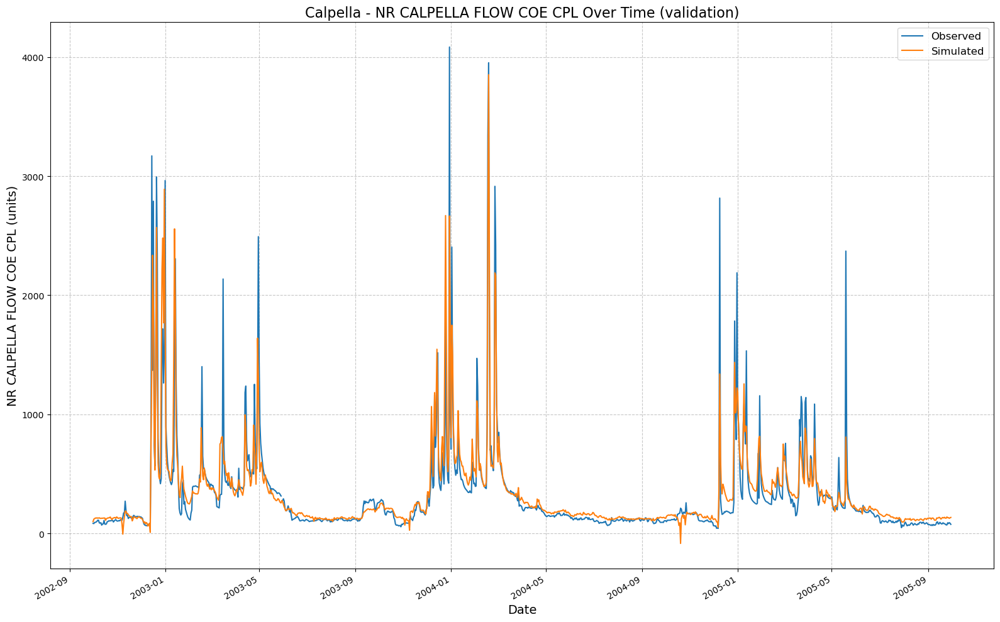

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190057/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:01:12,131: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190112/output.log initialized.
2025-02-16 19:01:12,132: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190112
2025-02-16 19:01:12,132: ### Run configurations for testing_run
2025-02-16 19:01:12,133: experiment_name: testing_run
2025-02-16 19:01:12,133: train_basin_file: calpella
2025-02-16 19:01:12,133: validation_basin_file: calpella
2025-02-16 19:01:12,134: test_basin_file: calpella
2025-02-16 19:01:12,134: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:01:12,134: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:01:

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.65it/s]
2025-02-16 19:01:12,244: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1305.01it/s]
2025-02-16 19:01:12,248: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 14.83it/s, Loss: 0.0000]
2025-02-16 19:01:13,114: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 15.38it/s, Loss: 0.0000]
2025-02-16 19:01:13,832: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 15.60it/s, Loss: 0.0000]
2025-02-16 19:01:14,540: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 15.53it/s, Loss: 0.0000]
2025-02-16 19:01:15,251: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 16.23it/s, Loss: 0.0000]
2025-02-16 19:01:15,931: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  4.16it/s]
2025-02-16 19:01:36,022: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190112/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:01:36,023: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190112/validation/model_epoch032/validation_results.p
got predictions


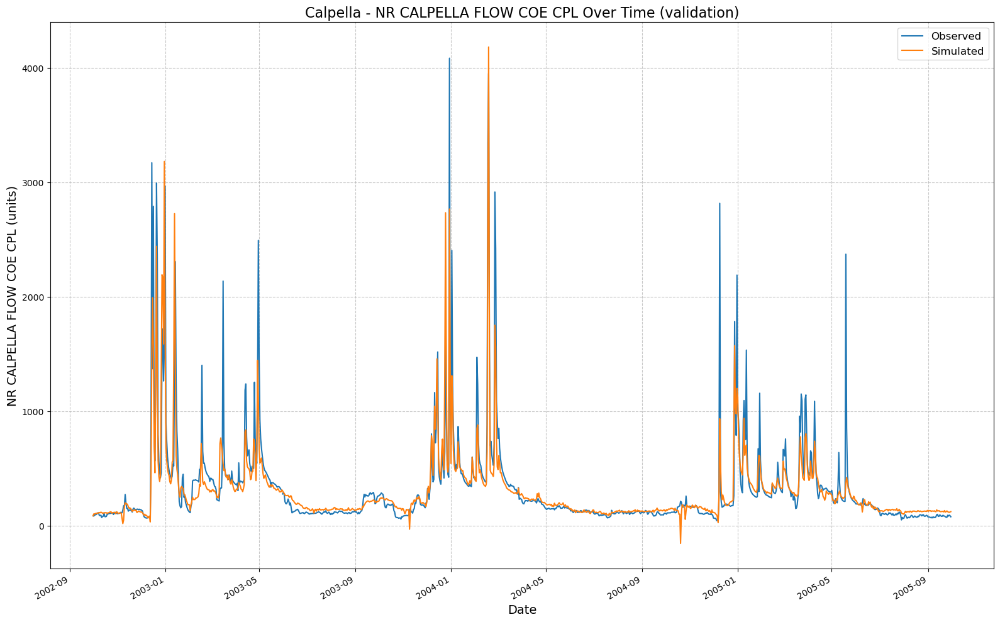

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190112/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:01:36,257: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190136/output.log initialized.
2025-02-16 19:01:36,257: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190136
2025-02-16 19:01:36,258: ### Run configurations for testing_run
2025-02-16 19:01:36,258: experiment_name: testing_run
2025-02-16 19:01:36,258: train_basin_file: calpella
2025-02-16 19:01:36,259: validation_basin_file: calpella
2025-02-16 19:01:36,259: test_basin_file: calpella
2025-02-16 19:01:36,259: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:01:36,260: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:01:

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.35it/s]
2025-02-16 19:01:36,364: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1192.24it/s]
2025-02-16 19:01:36,368: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 18.39it/s, Loss: 0.0000]
2025-02-16 19:01:37,095: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 18.10it/s, Loss: 0.0000]
2025-02-16 19:01:37,704: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 17.03it/s, Loss: 0.0000]
2025-02-16 19:01:38,352: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 12.76it/s, Loss: 0.0000]
2025-02-16 19:01:39,217: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 13.53it/s, Loss: 0.0000]
2025-02-16 19:01:40,032: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]
2025-02-16 19:01:48,554: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190136/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:01:48,555: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190136/validation/model_epoch016/validation_results.p
got predictions


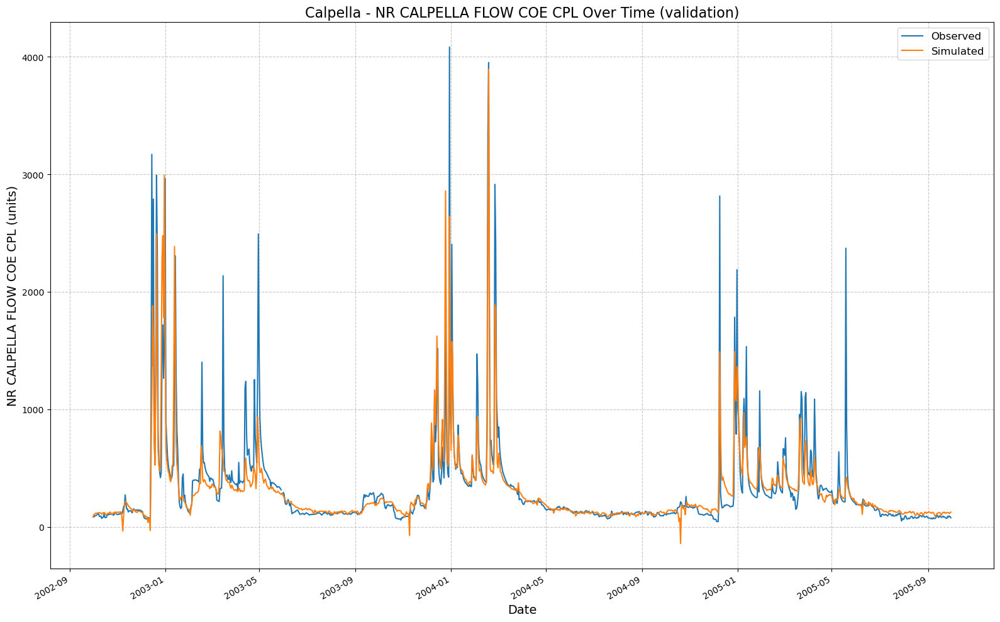

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190136/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:01:48,790: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190148/output.log initialized.
2025-02-16 19:01:48,791: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190148
2025-02-16 19:01:48,791: ### Run configurations for testing_run
2025-02-16 19:01:48,791: experiment_name: testing_run
2025-02-16 19:01:48,791: train_basin_file: calpella
2025-02-16 19:01:48,792: validation_basin_file: calpella
2025-02-16 19:01:48,792: test_basin_file: calpella
2025-02-16 19:01:48,792: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:01:48,793: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:01:

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.81it/s]
2025-02-16 19:01:48,899: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1318.96it/s]
2025-02-16 19:01:48,903: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 17.89it/s, Loss: 0.0000]
2025-02-16 19:01:49,647: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 18.35it/s, Loss: 0.0000]
2025-02-16 19:01:50,249: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 17.74it/s, Loss: 0.0000]
2025-02-16 19:01:50,871: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 15.55it/s, Loss: 0.0000]
2025-02-16 19:01:51,581: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 12.59it/s, Loss: 0.0000]
2025-02-16 19:01:52,458: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]
2025-02-16 19:02:12,499: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190148/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:02:12,500: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190148/validation/model_epoch032/validation_results.p
got predictions


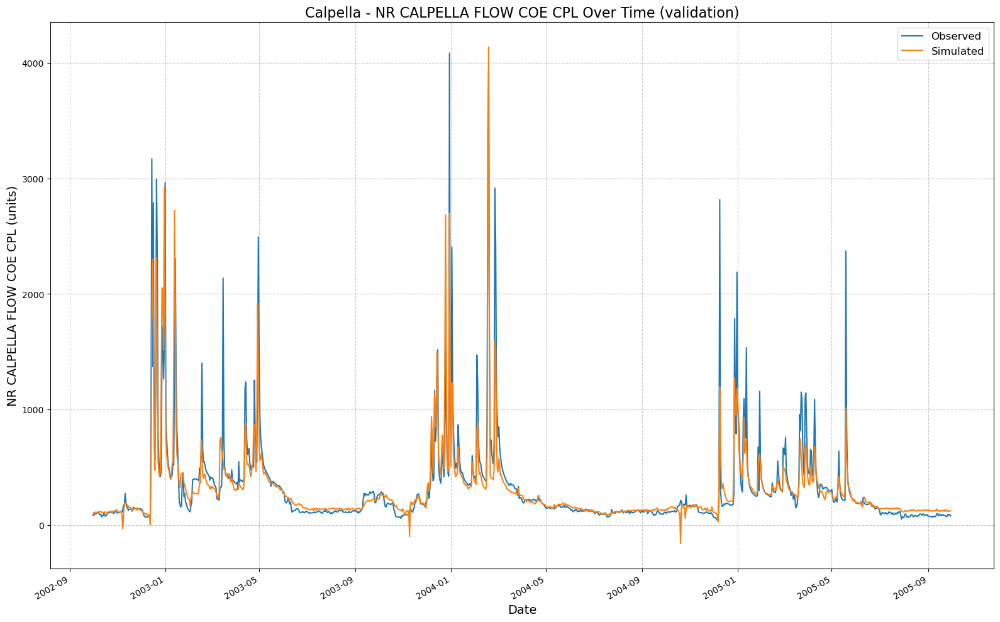

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190148/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:02:12,729: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190212/output.log initialized.
2025-02-16 19:02:12,729: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190212
2025-02-16 19:02:12,730: ### Run configurations for testing_run
2025-02-16 19:02:12,730: experiment_name: testing_run
2025-02-16 19:02:12,731: train_basin_file: calpella
2025-02-16 19:02:12,731: validation_basin_file: calpella
2025-02-16 19:02:12,731: test_basin_file: calpella
2025-02-16 19:02:12,732: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:02:12,732: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:02

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.09it/s]
2025-02-16 19:02:12,849: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1343.90it/s]
2025-02-16 19:02:12,853: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.06it/s, Loss: 0.0000]
2025-02-16 19:02:14,570: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.20it/s, Loss: 0.0000]
2025-02-16 19:02:15,769: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.45it/s, Loss: 0.0000]
2025-02-16 19:02:17,248: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.54it/s, Loss: 0.0000]
2025-02-16 19:02:18,403: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.69it/s, Loss: 0.0000]
2025-02-16 19:02:19,672: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]
2025-02-16 19:02:34,994: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190212/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:02:34,994: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190212/validation/model_epoch016/validation_results.p
got predictions


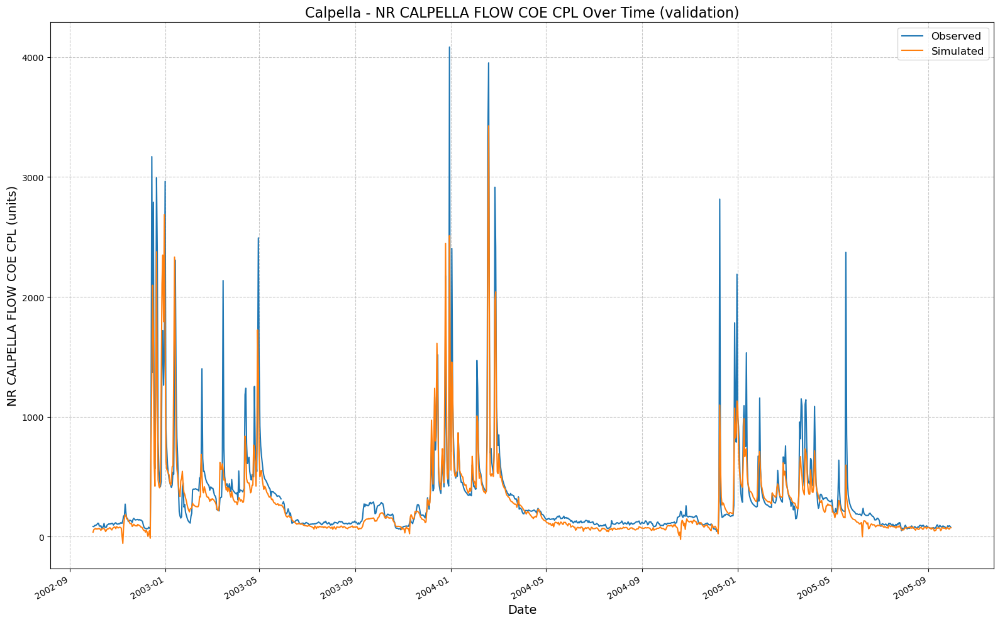

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190212/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:02:35,220: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190235/output.log initialized.
2025-02-16 19:02:35,221: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190235
2025-02-16 19:02:35,221: ### Run configurations for testing_run
2025-02-16 19:02:35,221: experiment_name: testing_run
2025-02-16 19:02:35,222: train_basin_file: calpella
2025-02-16 19:02:35,222: validation_basin_file: calpella
2025-02-16 19:02:35,222: test_basin_file: calpella
2025-02-16 19:02:35,223: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:02:35,223: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:02

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.29it/s]
2025-02-16 19:02:35,328: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1550.57it/s]
2025-02-16 19:02:35,332: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.19it/s, Loss: 0.0000]
2025-02-16 19:02:36,658: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.61it/s, Loss: 0.0000]
2025-02-16 19:02:38,107: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.10it/s, Loss: 0.0000]
2025-02-16 19:02:39,319: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.06it/s, Loss: 0.0000]
2025-02-16 19:02:40,534: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.85it/s, Loss: 0.0000]
2025-02-16 19:02:41,780: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]
2025-02-16 19:03:18,971: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190235/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:03:18,972: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190235/validation/model_epoch032/validation_results.p
got predictions


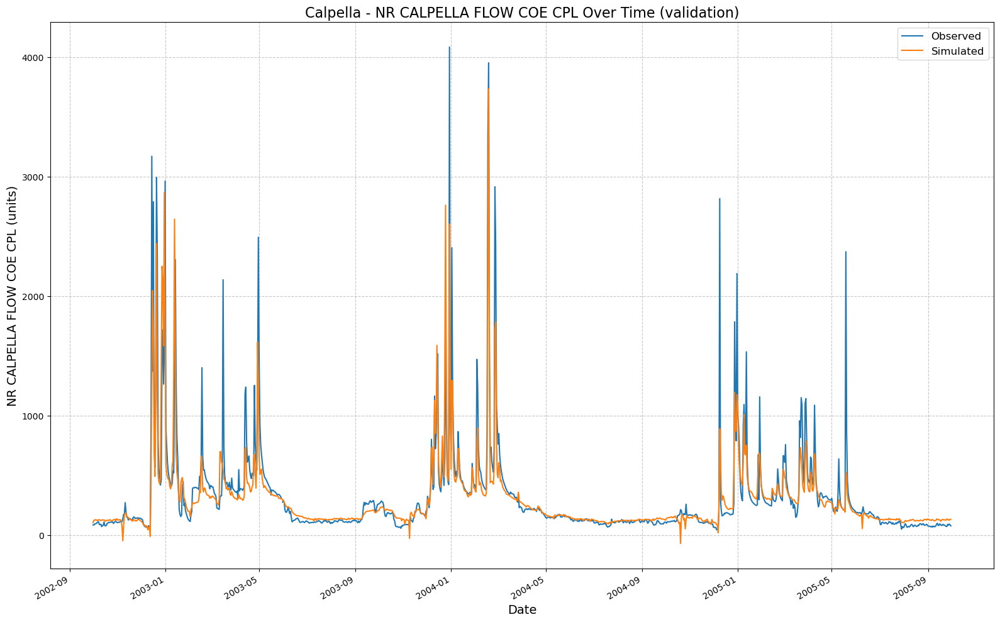

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190235/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:03:19,200: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190319/output.log initialized.
2025-02-16 19:03:19,200: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190319
2025-02-16 19:03:19,201: ### Run configurations for testing_run
2025-02-16 19:03:19,201: experiment_name: testing_run
2025-02-16 19:03:19,201: train_basin_file: calpella
2025-02-16 19:03:19,202: validation_basin_file: calpella
2025-02-16 19:03:19,202: test_basin_file: calpella
2025-02-16 19:03:19,203: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:03:19,203: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:03

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.72it/s]
2025-02-16 19:03:19,352: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1060.51it/s]
2025-02-16 19:03:19,369: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.05it/s, Loss: 0.0000]
2025-02-16 19:03:20,729: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.28it/s, Loss: 0.0000]
2025-02-16 19:03:21,916: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.51it/s, Loss: 0.0000]
2025-02-16 19:03:23,383: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.42it/s, Loss: 0.0000]
2025-02-16 19:03:24,554: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.55it/s, Loss: 0.0000]
2025-02-16 19:03:25,842: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]
2025-02-16 19:03:41,816: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190319/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:03:41,817: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190319/validation/model_epoch016/validation_results.p
got predictions


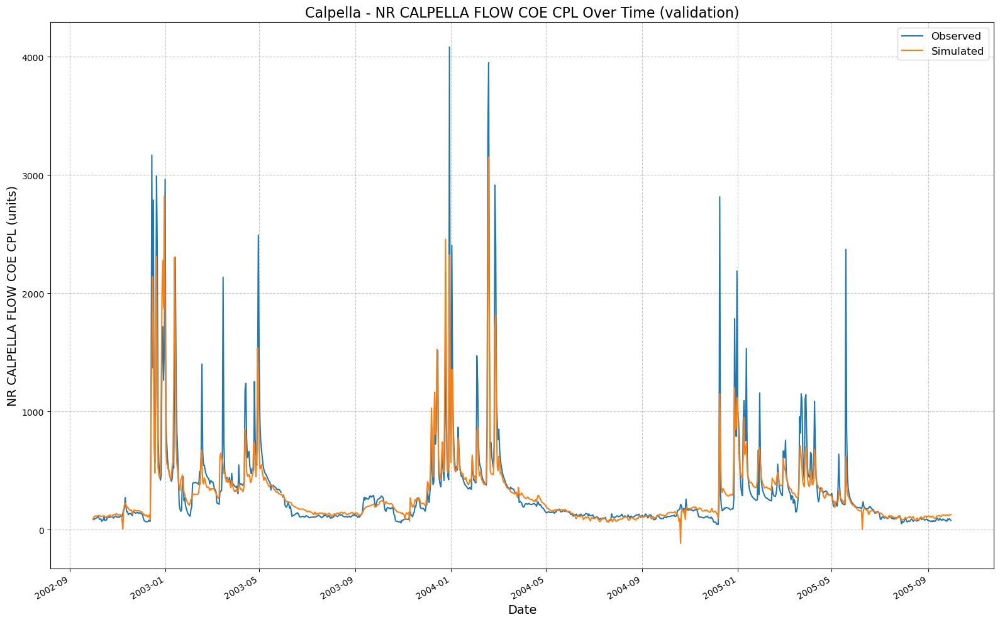

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190319/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:03:42,045: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190342/output.log initialized.
2025-02-16 19:03:42,046: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190342
2025-02-16 19:03:42,046: ### Run configurations for testing_run
2025-02-16 19:03:42,047: experiment_name: testing_run
2025-02-16 19:03:42,047: train_basin_file: calpella
2025-02-16 19:03:42,048: validation_basin_file: calpella
2025-02-16 19:03:42,048: test_basin_file: calpella
2025-02-16 19:03:42,048: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:03:42,049: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:03

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.15it/s]
2025-02-16 19:03:42,153: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1485.76it/s]
2025-02-16 19:03:42,157: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.77it/s, Loss: 0.0000]
2025-02-16 19:03:43,541: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.80it/s, Loss: 0.0000]
2025-02-16 19:03:44,795: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.49it/s, Loss: 0.0000]
2025-02-16 19:03:46,094: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.99it/s, Loss: 0.0000]
2025-02-16 19:03:47,320: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.38it/s, Loss: 0.0000]
2025-02-16 19:03:48,814: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]
2025-02-16 19:04:27,387: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190342/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:04:27,388: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190342/validation/model_epoch032/validation_results.p
got predictions


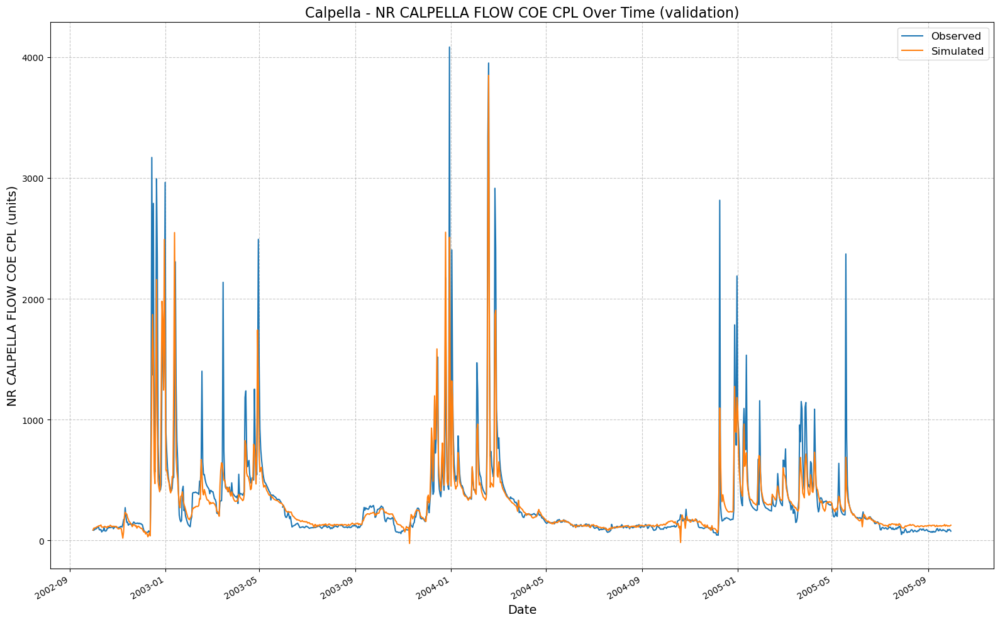

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190342/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:04:27,661: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190427/output.log initialized.
2025-02-16 19:04:27,663: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190427
2025-02-16 19:04:27,663: ### Run configurations for testing_run
2025-02-16 19:04:27,664: experiment_name: testing_run
2025-02-16 19:04:27,665: train_basin_file: calpella
2025-02-16 19:04:27,666: validation_basin_file: calpella
2025-02-16 19:04:27,666: test_basin_file: calpella
2025-02-16 19:04:27,666: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:04:27,667: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:04

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  8.17it/s]
2025-02-16 19:04:27,819: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1183.49it/s]
2025-02-16 19:04:27,823: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.95it/s, Loss: 0.0000]
2025-02-16 19:04:29,163: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.73it/s, Loss: 0.0000]
2025-02-16 19:04:30,426: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.96it/s, Loss: 0.0000]
2025-02-16 19:04:31,657: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.78it/s, Loss: 0.0000]
2025-02-16 19:04:32,914: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.06it/s, Loss: 0.0000]
2025-02-16 19:04:34,131: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]
2025-02-16 19:04:51,295: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190427/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:04:51,296: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190427/validation/model_epoch016/validation_results.p
got predictions


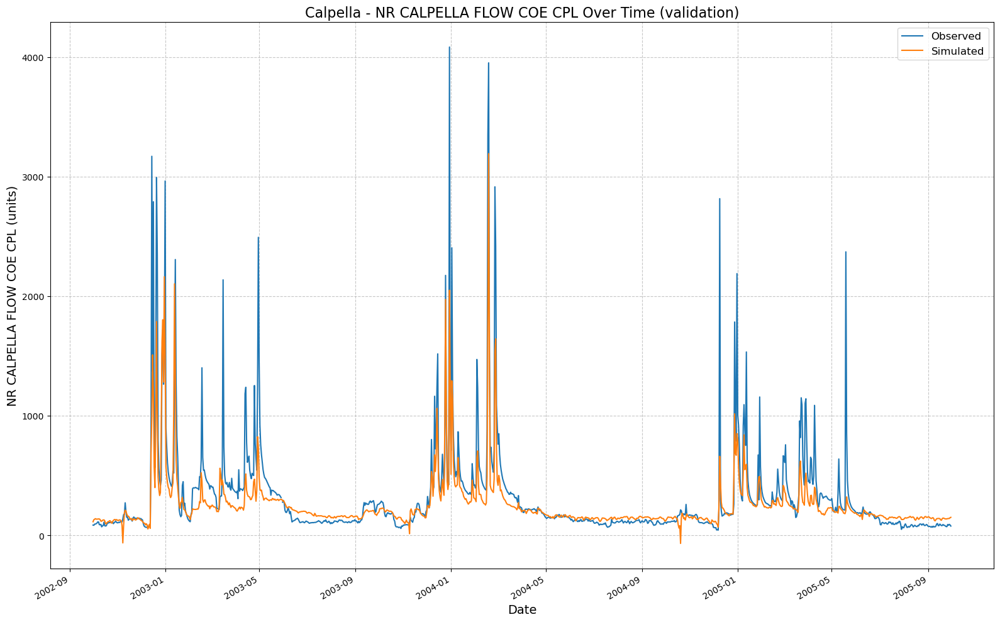

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190427/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:04:51,532: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190451/output.log initialized.
2025-02-16 19:04:51,533: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190451
2025-02-16 19:04:51,533: ### Run configurations for testing_run
2025-02-16 19:04:51,534: experiment_name: testing_run
2025-02-16 19:04:51,534: train_basin_file: calpella
2025-02-16 19:04:51,534: validation_basin_file: calpella
2025-02-16 19:04:51,535: test_basin_file: calpella
2025-02-16 19:04:51,535: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:04:51,535: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:04

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.01it/s]
2025-02-16 19:04:51,642: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1119.38it/s]
2025-02-16 19:04:51,646: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.54it/s, Loss: 0.0000]
2025-02-16 19:04:52,922: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.36it/s, Loss: 0.0000]
2025-02-16 19:04:54,100: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.63it/s, Loss: 0.0000]
2025-02-16 19:04:55,543: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.00it/s, Loss: 0.0000]
2025-02-16 19:04:56,768: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.01it/s, Loss: 0.0000]
2025-02-16 19:04:57,991: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]
2025-02-16 19:05:36,974: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190451/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:05:36,975: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190451/validation/model_epoch032/validation_results.p
got predictions


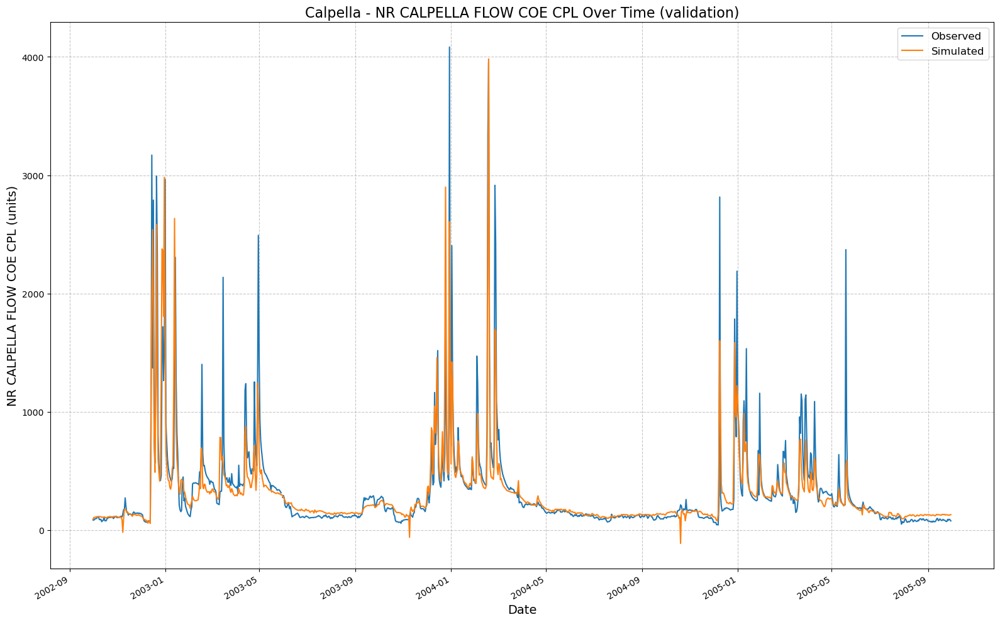

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190451/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:05:37,208: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190537/output.log initialized.
2025-02-16 19:05:37,208: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190537
2025-02-16 19:05:37,209: ### Run configurations for testing_run
2025-02-16 19:05:37,209: experiment_name: testing_run
2025-02-16 19:05:37,210: train_basin_file: calpella
2025-02-16 19:05:37,210: validation_basin_file: calpella
2025-02-16 19:05:37,210: test_basin_file: calpella
2025-02-16 19:05:37,211: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:05:37,211: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:05

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.37it/s]
2025-02-16 19:05:37,316: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1345.62it/s]
2025-02-16 19:05:37,320: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00, 10.45it/s, Loss: 0.0000]
2025-02-16 19:05:38,500: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00, 10.08it/s, Loss: 0.0000]
2025-02-16 19:05:39,593: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00, 10.40it/s, Loss: 0.0000]
2025-02-16 19:05:40,653: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.16it/s, Loss: 0.0000]
2025-02-16 19:05:42,003: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.39it/s, Loss: 0.0000]
2025-02-16 19:05:43,317: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]
2025-02-16 19:05:58,906: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190537/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:05:58,907: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190537/validation/model_epoch016/validation_results.p
got predictions


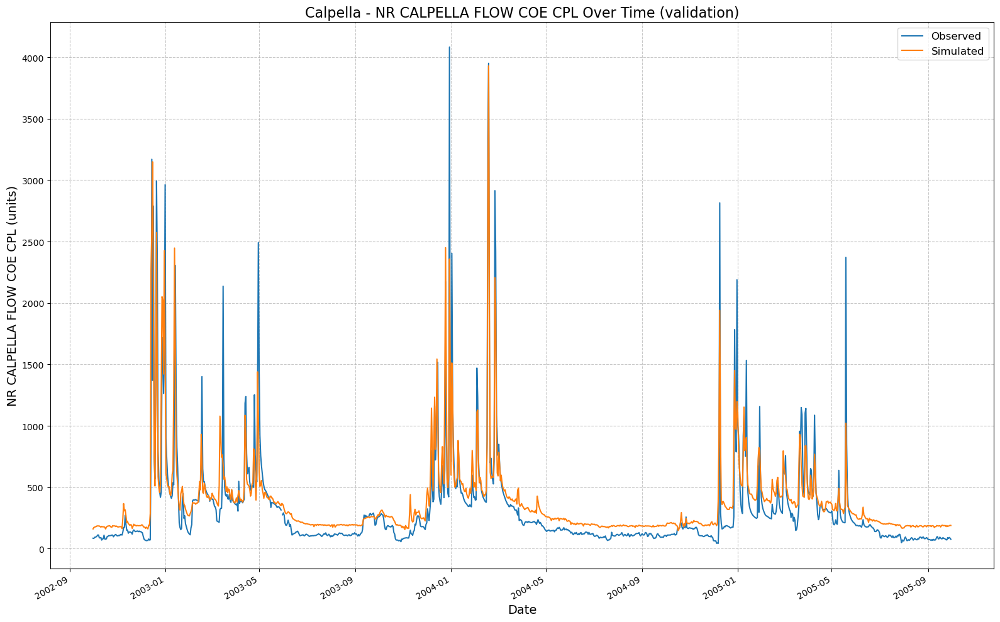

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190537/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:05:59,148: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190559/output.log initialized.
2025-02-16 19:05:59,148: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190559
2025-02-16 19:05:59,148: ### Run configurations for testing_run
2025-02-16 19:05:59,149: experiment_name: testing_run
2025-02-16 19:05:59,149: train_basin_file: calpella
2025-02-16 19:05:59,149: validation_basin_file: calpella
2025-02-16 19:05:59,149: test_basin_file: calpella
2025-02-16 19:05:59,150: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:05:59,150: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:05

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.42it/s]
2025-02-16 19:05:59,261: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1647.41it/s]
2025-02-16 19:05:59,265: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.95it/s, Loss: 0.0000]
2025-02-16 19:06:00,615: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.32it/s, Loss: 0.0000]
2025-02-16 19:06:01,797: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.23it/s, Loss: 0.0000]
2025-02-16 19:06:02,991: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.76it/s, Loss: 0.0000]
2025-02-16 19:06:04,121: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00, 10.11it/s, Loss: 0.0000]
2025-02-16 19:06:05,212: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]
2025-02-16 19:06:42,232: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190559/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:06:42,233: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190559/validation/model_epoch032/validation_results.p
got predictions


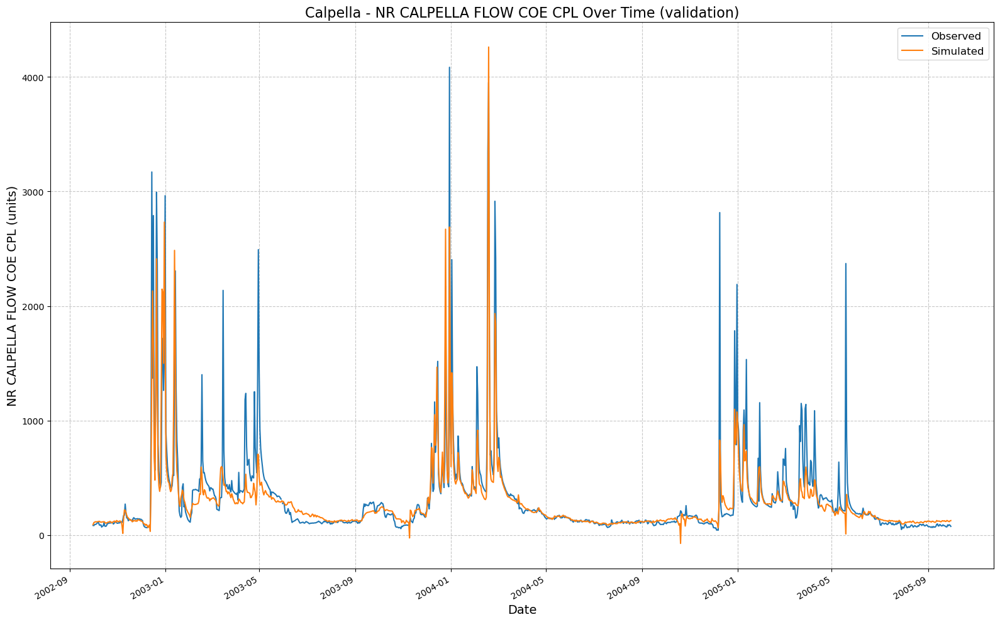

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190559/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:06:42,463: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190642/output.log initialized.
2025-02-16 19:06:42,463: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190642
2025-02-16 19:06:42,464: ### Run configurations for testing_run
2025-02-16 19:06:42,464: experiment_name: testing_run
2025-02-16 19:06:42,465: train_basin_file: calpella
2025-02-16 19:06:42,465: validation_basin_file: calpella
2025-02-16 19:06:42,465: test_basin_file: calpella
2025-02-16 19:06:42,466: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:06:42,466: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.70it/s]
2025-02-16 19:06:42,577: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1206.30it/s]
2025-02-16 19:06:42,582: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.47it/s, Loss: 0.0000]
2025-02-16 19:06:45,175: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.16it/s, Loss: 0.0000]
2025-02-16 19:06:47,824: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.99it/s, Loss: 0.0000]
2025-02-16 19:06:50,042: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.78it/s, Loss: 0.0000]
2025-02-16 19:06:52,347: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.20it/s, Loss: 0.0000]
2025-02-16 19:06:54,971: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]
2025-02-16 19:07:24,670: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190642/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:07:24,677: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190642/validation/model_epoch016/validation_results.p
got predictions


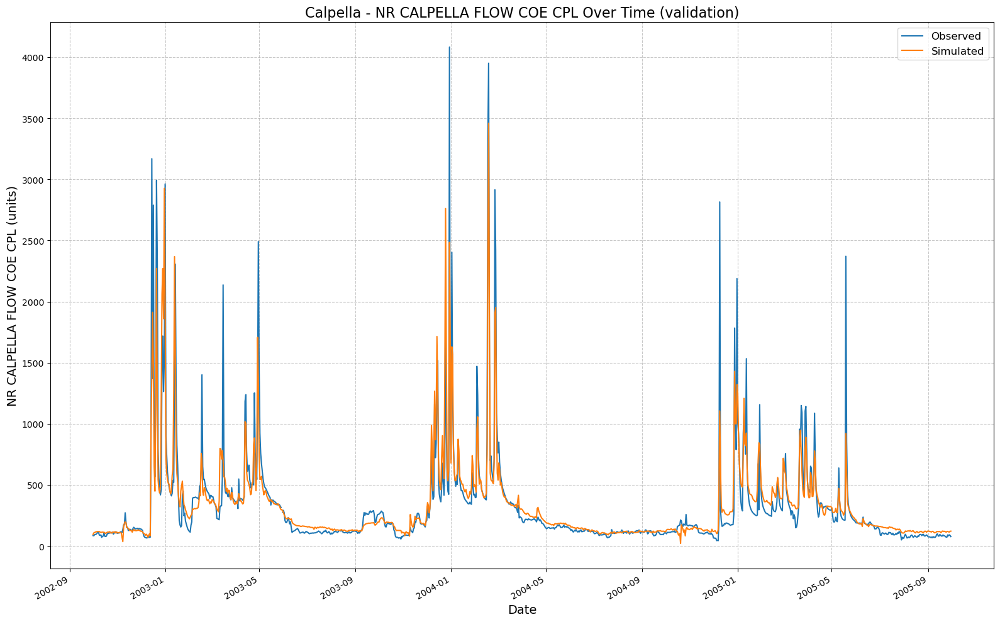

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190642/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:07:25,080: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190725/output.log initialized.
2025-02-16 19:07:25,080: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190725
2025-02-16 19:07:25,080: ### Run configurations for testing_run
2025-02-16 19:07:25,081: experiment_name: testing_run
2025-02-16 19:07:25,081: train_basin_file: calpella
2025-02-16 19:07:25,081: validation_basin_file: calpella
2025-02-16 19:07:25,082: test_basin_file: calpella
2025-02-16 19:07:25,082: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:07:25,082: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.26it/s]
2025-02-16 19:07:25,198: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1055.97it/s]
2025-02-16 19:07:25,203: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.55it/s, Loss: 0.0000]
2025-02-16 19:07:27,814: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.61it/s, Loss: 0.0000]
2025-02-16 19:07:30,209: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.42it/s, Loss: 0.0000]
2025-02-16 19:07:32,702: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  3.97it/s, Loss: 0.0000]
2025-02-16 19:07:35,479: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.83it/s, Loss: 0.0000]
2025-02-16 19:07:37,762: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]
2025-02-16 19:08:51,915: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190725/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:08:51,916: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190725/validation/model_epoch032/validation_results.p
got predictions


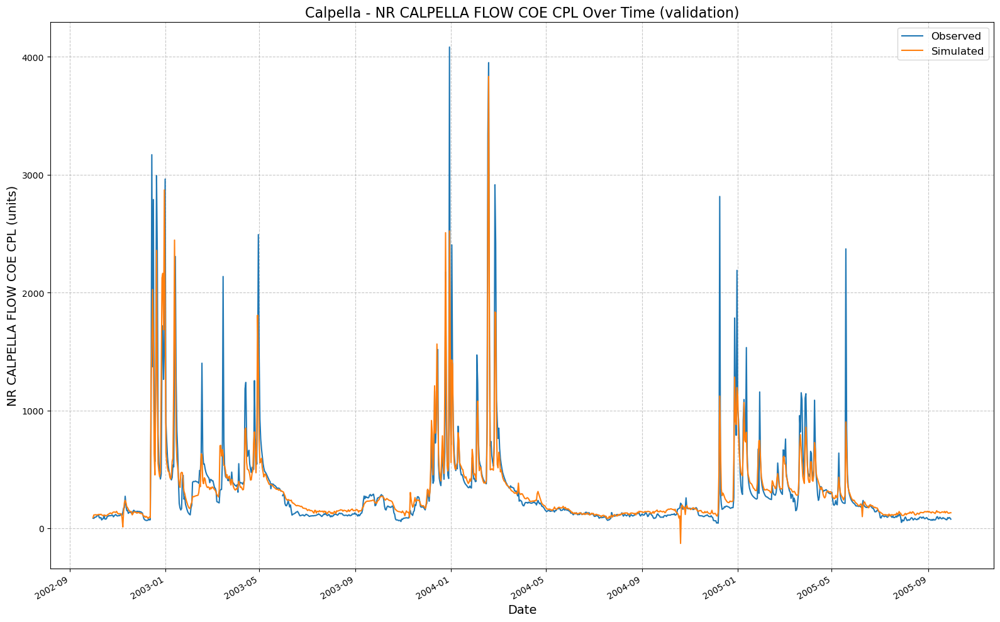

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190725/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:08:52,148: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190852/output.log initialized.
2025-02-16 19:08:52,149: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190852
2025-02-16 19:08:52,149: ### Run configurations for testing_run
2025-02-16 19:08:52,149: experiment_name: testing_run
2025-02-16 19:08:52,150: train_basin_file: calpella
2025-02-16 19:08:52,150: validation_basin_file: calpella
2025-02-16 19:08:52,151: test_basin_file: calpella
2025-02-16 19:08:52,151: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:08:52,151: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.14it/s]
2025-02-16 19:08:52,281: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1209.08it/s]
2025-02-16 19:08:52,287: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  3.86it/s, Loss: 0.0000]
2025-02-16 19:08:55,294: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.38it/s, Loss: 0.0000]
2025-02-16 19:08:57,810: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.14it/s, Loss: 0.0000]
2025-02-16 19:09:00,474: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.60it/s, Loss: 0.0000]
2025-02-16 19:09:02,870: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.59it/s, Loss: 0.0000]
2025-02-16 19:09:05,272: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]
2025-02-16 19:09:34,966: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190852/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:09:34,966: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190852/validation/model_epoch016/validation_results.p
got predictions


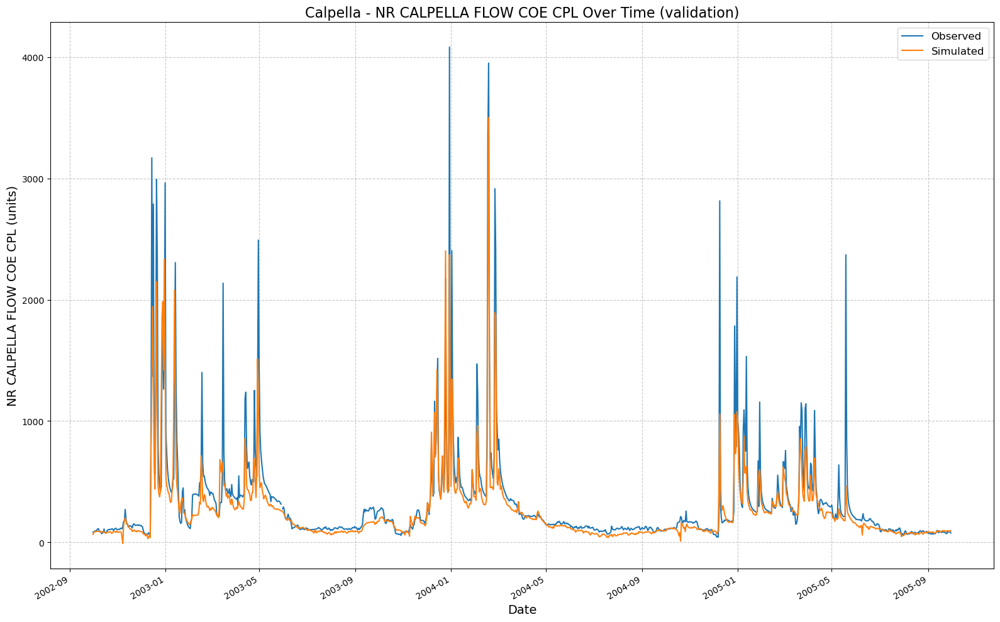

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190852/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:09:35,217: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190935/output.log initialized.
2025-02-16 19:09:35,218: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190935
2025-02-16 19:09:35,218: ### Run configurations for testing_run
2025-02-16 19:09:35,218: experiment_name: testing_run
2025-02-16 19:09:35,219: train_basin_file: calpella
2025-02-16 19:09:35,219: validation_basin_file: calpella
2025-02-16 19:09:35,219: test_basin_file: calpella
2025-02-16 19:09:35,219: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:09:35,220: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.66it/s]
2025-02-16 19:09:35,328: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1360.46it/s]
2025-02-16 19:09:35,332: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.50it/s, Loss: 0.0000]
2025-02-16 19:09:37,883: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.05it/s, Loss: 0.0000]
2025-02-16 19:09:40,603: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.74it/s, Loss: 0.0000]
2025-02-16 19:09:42,928: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.34it/s, Loss: 0.0000]
2025-02-16 19:09:45,464: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.66it/s, Loss: 0.0000]
2025-02-16 19:09:48,476: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]
2025-02-16 19:11:03,215: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190935/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:11:03,216: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190935/validation/model_epoch032/validation_results.p
got predictions


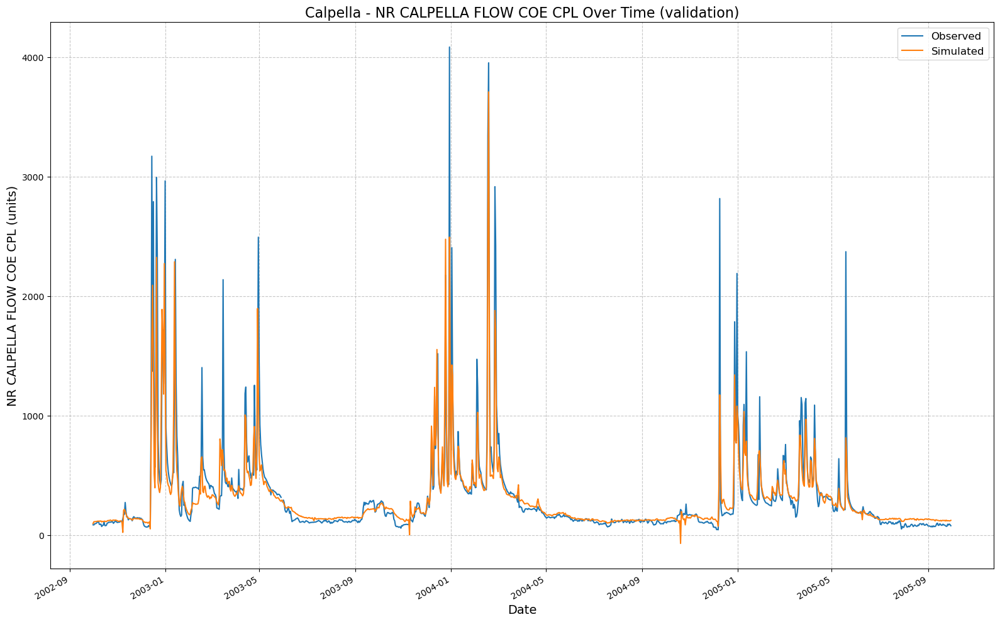

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_190935/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:11:03,452: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191103/output.log initialized.
2025-02-16 19:11:03,452: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191103
2025-02-16 19:11:03,453: ### Run configurations for testing_run
2025-02-16 19:11:03,453: experiment_name: testing_run
2025-02-16 19:11:03,454: train_basin_file: calpella
2025-02-16 19:11:03,454: validation_basin_file: calpella
2025-02-16 19:11:03,454: test_basin_file: calpella
2025-02-16 19:11:03,455: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:11:03,455: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:11

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.42it/s]
2025-02-16 19:11:03,577: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1134.82it/s]
2025-02-16 19:11:03,581: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.80it/s, Loss: 0.0000]
2025-02-16 19:11:06,004: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.86it/s, Loss: 0.0000]
2025-02-16 19:11:08,272: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.65it/s, Loss: 0.0000]
2025-02-16 19:11:10,642: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.51it/s, Loss: 0.0000]
2025-02-16 19:11:13,082: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.44it/s, Loss: 0.0000]
2025-02-16 19:11:16,282: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]
2025-02-16 19:11:49,240: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191103/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:11:49,241: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191103/validation/model_epoch016/validation_results.p
got predictions


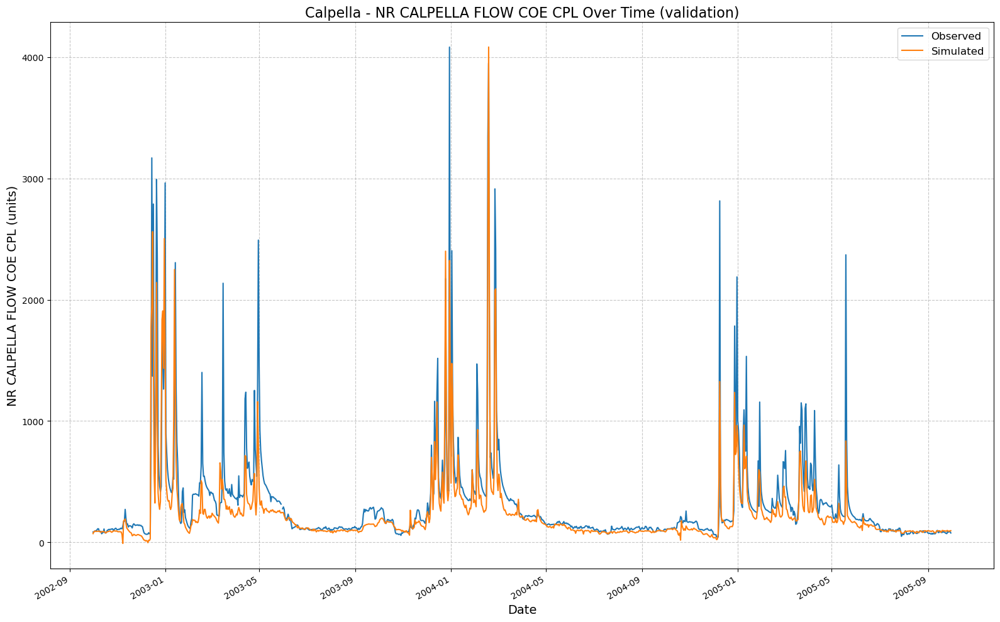

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191103/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:11:49,477: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191149/output.log initialized.
2025-02-16 19:11:49,477: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191149
2025-02-16 19:11:49,478: ### Run configurations for testing_run
2025-02-16 19:11:49,478: experiment_name: testing_run
2025-02-16 19:11:49,479: train_basin_file: calpella
2025-02-16 19:11:49,479: validation_basin_file: calpella
2025-02-16 19:11:49,479: test_basin_file: calpella
2025-02-16 19:11:49,480: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:11:49,480: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:11

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.33it/s]
2025-02-16 19:11:49,585: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1298.55it/s]
2025-02-16 19:11:49,590: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.38it/s, Loss: 0.0000]
2025-02-16 19:11:52,217: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.45it/s, Loss: 0.0000]
2025-02-16 19:11:54,693: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.40it/s, Loss: 0.0000]
2025-02-16 19:11:57,199: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.20it/s, Loss: 0.0000]
2025-02-16 19:11:59,818: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.18it/s, Loss: 0.0000]
2025-02-16 19:12:02,454: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]
2025-02-16 19:13:16,359: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191149/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:13:16,360: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191149/validation/model_epoch032/validation_results.p
got predictions


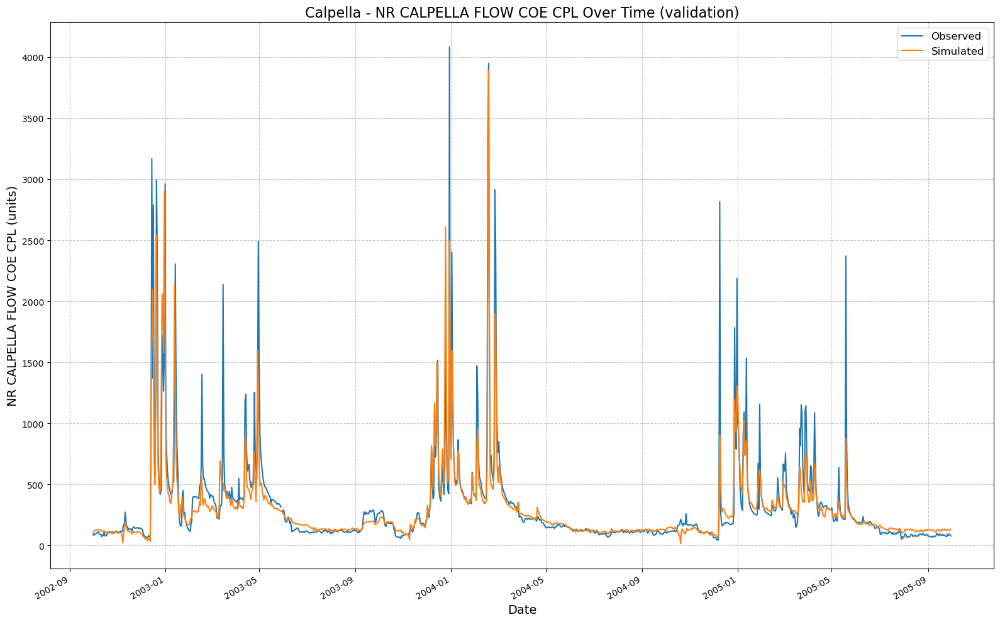

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191149/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:13:16,615: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191316/output.log initialized.
2025-02-16 19:13:16,616: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191316
2025-02-16 19:13:16,616: ### Run configurations for testing_run
2025-02-16 19:13:16,616: experiment_name: testing_run
2025-02-16 19:13:16,617: train_basin_file: calpella
2025-02-16 19:13:16,617: validation_basin_file: calpella
2025-02-16 19:13:16,617: test_basin_file: calpella
2025-02-16 19:13:16,618: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:13:16,618: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:13

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.70it/s]
2025-02-16 19:13:16,731: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1256.53it/s]
2025-02-16 19:13:16,735: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.63it/s, Loss: 0.0000]
2025-02-16 19:13:19,901: Epoch 1 average loss: avg_loss: 0.00001, avg_total_loss: 0.00001
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.64it/s, Loss: 0.0000]
2025-02-16 19:13:22,275: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.48it/s, Loss: 0.0000]
2025-02-16 19:13:24,733: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.51it/s, Loss: 0.0000]
2025-02-16 19:13:27,176: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.44it/s, Loss: 0.0000]
2025-02-16 19:13:29,658: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]
2025-02-16 19:14:00,770: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191316/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:14:00,772: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191316/validation/model_epoch016/validation_results.p
got predictions


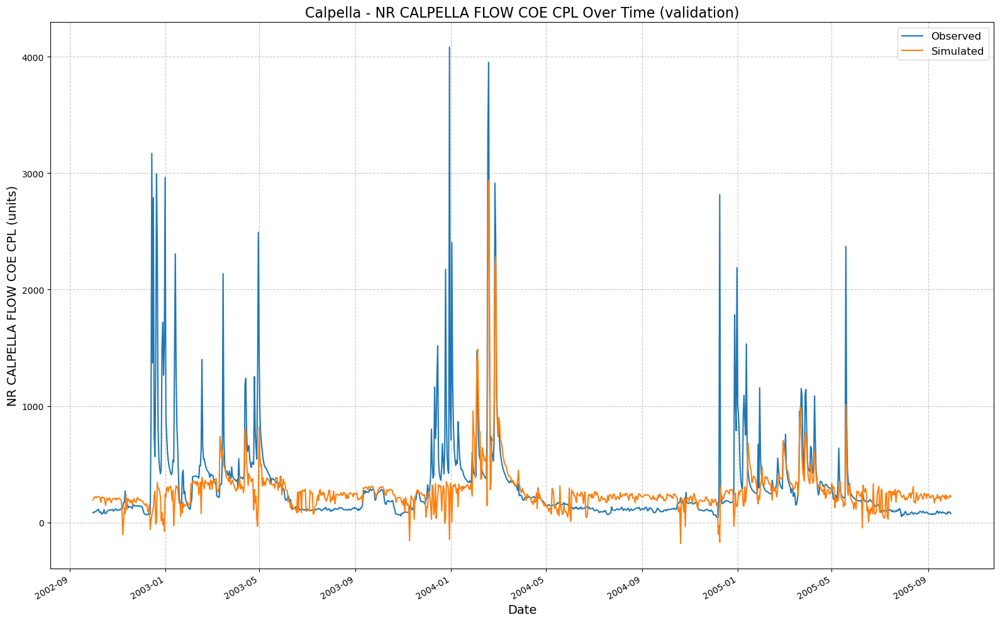

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191316/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:14:00,999: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191400/output.log initialized.
2025-02-16 19:14:00,999: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191400
2025-02-16 19:14:00,999: ### Run configurations for testing_run
2025-02-16 19:14:01,000: experiment_name: testing_run
2025-02-16 19:14:01,000: train_basin_file: calpella
2025-02-16 19:14:01,000: validation_basin_file: calpella
2025-02-16 19:14:01,001: test_basin_file: calpella
2025-02-16 19:14:01,001: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:14:01,002: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:14

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.08it/s]
2025-02-16 19:14:01,120: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1262.58it/s]
2025-02-16 19:14:01,123: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.24it/s, Loss: 0.0000]
2025-02-16 19:14:03,862: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.46it/s, Loss: 0.0000]
2025-02-16 19:14:06,330: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.51it/s, Loss: 0.0000]
2025-02-16 19:14:08,774: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.87it/s, Loss: 0.0000]
2025-02-16 19:14:11,033: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.47it/s, Loss: 0.0000]
2025-02-16 19:14:13,498: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]
2025-02-16 19:15:24,767: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191400/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:15:24,768: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191400/validation/model_epoch032/validation_results.p
got predictions


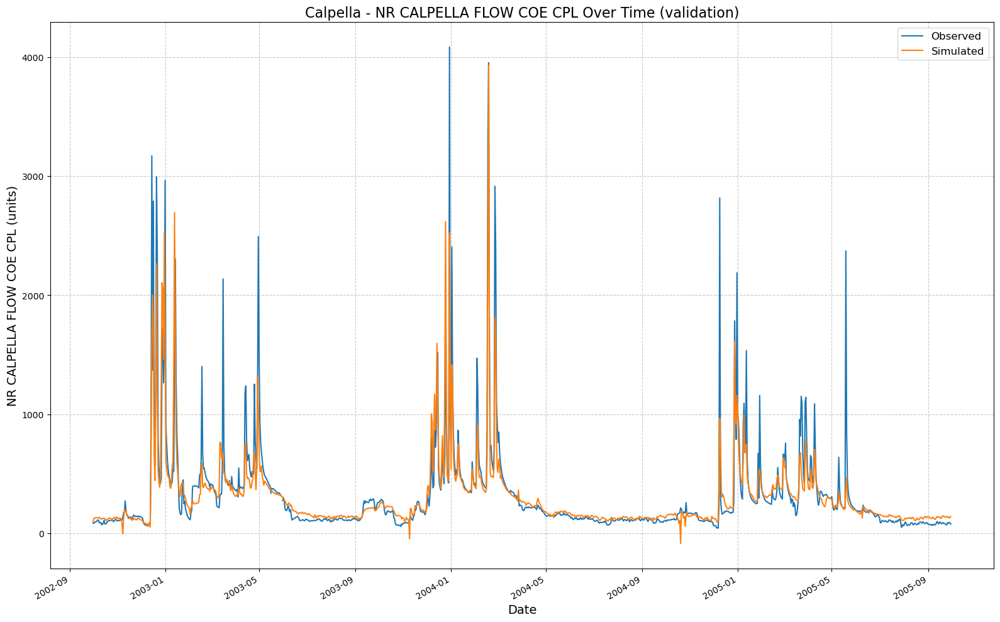

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191400/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:15:25,003: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191525/output.log initialized.
2025-02-16 19:15:25,003: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191525
2025-02-16 19:15:25,004: ### Run configurations for testing_run
2025-02-16 19:15:25,004: experiment_name: testing_run
2025-02-16 19:15:25,005: train_basin_file: calpella
2025-02-16 19:15:25,005: validation_basin_file: calpella
2025-02-16 19:15:25,005: test_basin_file: calpella
2025-02-16 19:15:25,006: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:15:25,006: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:1

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.25it/s]
2025-02-16 19:15:25,121: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1251.66it/s]
2025-02-16 19:15:25,125: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.18it/s, Loss: 0.0000]
2025-02-16 19:15:30,295: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:04<00:00,  2.35it/s, Loss: 0.0000]
2025-02-16 19:15:34,977: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:04<00:00,  2.22it/s, Loss: 0.0000]
2025-02-16 19:15:39,925: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.06it/s, Loss: 0.0000]
2025-02-16 19:15:45,284: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:05<00:00,  2.07it/s, Loss: 0.0000]
2025-02-16 19:15:50,605: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]
2025-02-16 19:16:52,770: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191525/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:16:52,773: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191525/validation/model_epoch016/validation_results.p
got predictions


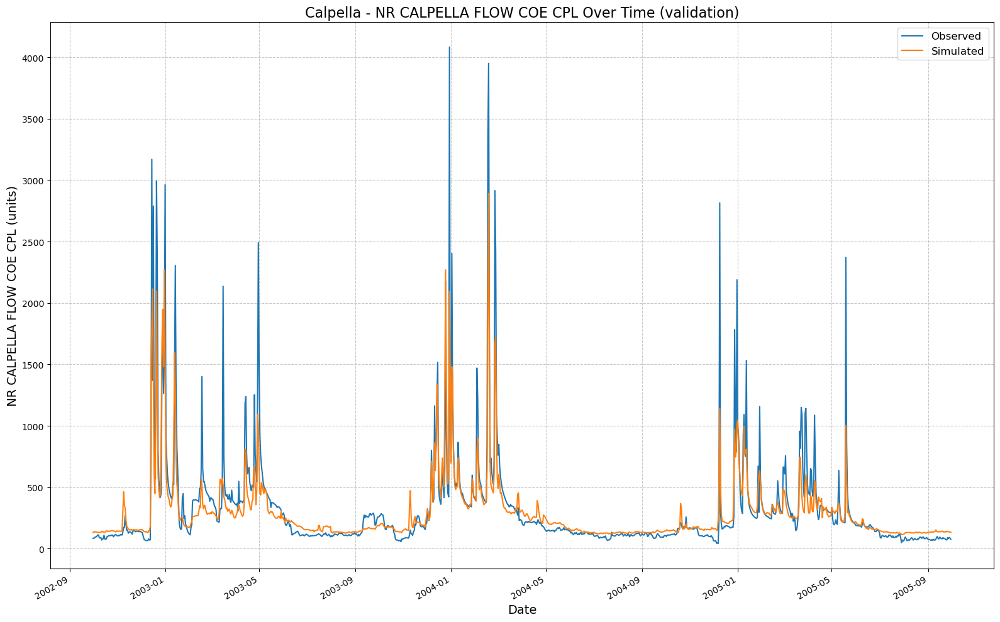

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191525/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:16:53,051: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191653/output.log initialized.
2025-02-16 19:16:53,051: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191653
2025-02-16 19:16:53,052: ### Run configurations for testing_run
2025-02-16 19:16:53,052: experiment_name: testing_run
2025-02-16 19:16:53,052: train_basin_file: calpella
2025-02-16 19:16:53,053: validation_basin_file: calpella
2025-02-16 19:16:53,053: test_basin_file: calpella
2025-02-16 19:16:53,054: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:16:53,054: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:1

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  8.25it/s]
2025-02-16 19:16:53,211: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1476.87it/s]
2025-02-16 19:16:53,216: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  1.91it/s, Loss: 0.0000]
2025-02-16 19:16:59,136: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.02it/s, Loss: 0.0000]
2025-02-16 19:17:04,597: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  1.98it/s, Loss: 0.0000]
2025-02-16 19:17:10,155: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.06it/s, Loss: 0.0000]
2025-02-16 19:17:15,510: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.24it/s, Loss: 0.0000]
2025-02-16 19:17:20,427: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]
2025-02-16 19:19:45,295: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191653/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:19:45,296: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191653/validation/model_epoch032/validation_results.p
got predictions


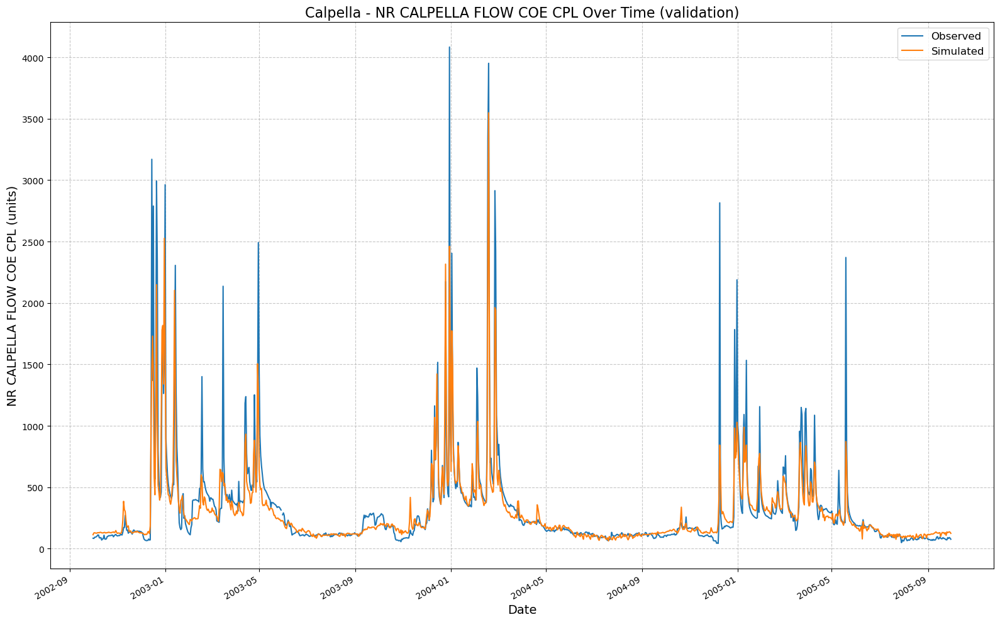

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191653/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:19:45,530: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191945/output.log initialized.
2025-02-16 19:19:45,530: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191945
2025-02-16 19:19:45,531: ### Run configurations for testing_run
2025-02-16 19:19:45,531: experiment_name: testing_run
2025-02-16 19:19:45,532: train_basin_file: calpella
2025-02-16 19:19:45,532: validation_basin_file: calpella
2025-02-16 19:19:45,532: test_basin_file: calpella
2025-02-16 19:19:45,533: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:19:45,533: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:1

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.89it/s]
2025-02-16 19:19:45,641: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1219.63it/s]
2025-02-16 19:19:45,646: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:04<00:00,  2.21it/s, Loss: 0.0000]
2025-02-16 19:19:50,758: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.03it/s, Loss: 0.0000]
2025-02-16 19:19:56,172: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  2.17it/s, Loss: 0.0000]
2025-02-16 19:20:01,234: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.05it/s, Loss: 0.0000]
2025-02-16 19:20:06,605: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.26it/s, Loss: 0.0000]
2025-02-16 19:20:11,470: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]
2025-02-16 19:21:09,992: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191945/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:21:09,993: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191945/validation/model_epoch016/validation_results.p
got predictions


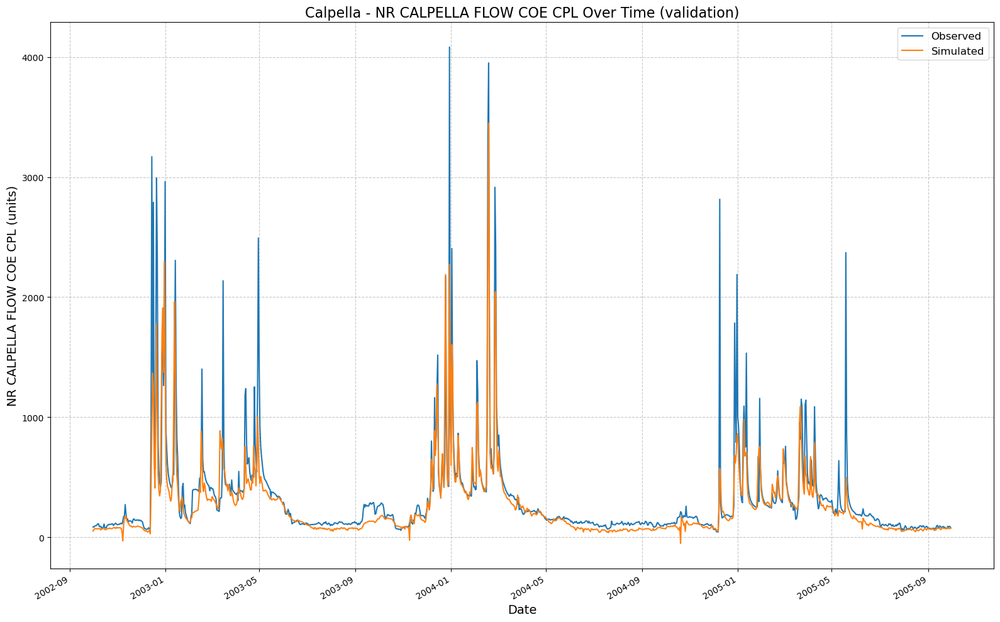

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_191945/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:21:10,226: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192110/output.log initialized.
2025-02-16 19:21:10,227: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192110
2025-02-16 19:21:10,227: ### Run configurations for testing_run
2025-02-16 19:21:10,228: experiment_name: testing_run
2025-02-16 19:21:10,228: train_basin_file: calpella
2025-02-16 19:21:10,229: validation_basin_file: calpella
2025-02-16 19:21:10,229: test_basin_file: calpella
2025-02-16 19:21:10,229: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:21:10,230: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:2

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.03it/s]
2025-02-16 19:21:10,351: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 588.18it/s]
2025-02-16 19:21:10,358: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.19it/s, Loss: 0.0000]
2025-02-16 19:21:15,525: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:04<00:00,  2.23it/s, Loss: 0.0000]
2025-02-16 19:21:20,473: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  2.20it/s, Loss: 0.0000]
2025-02-16 19:21:25,476: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:04<00:00,  2.21it/s, Loss: 0.0000]
2025-02-16 19:21:30,459: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:05<00:00,  2.12it/s, Loss: 0.0000]
2025-02-16 19:21:35,643: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]
2025-02-16 19:23:55,663: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192110/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:23:55,664: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192110/validation/model_epoch032/validation_results.p
got predictions


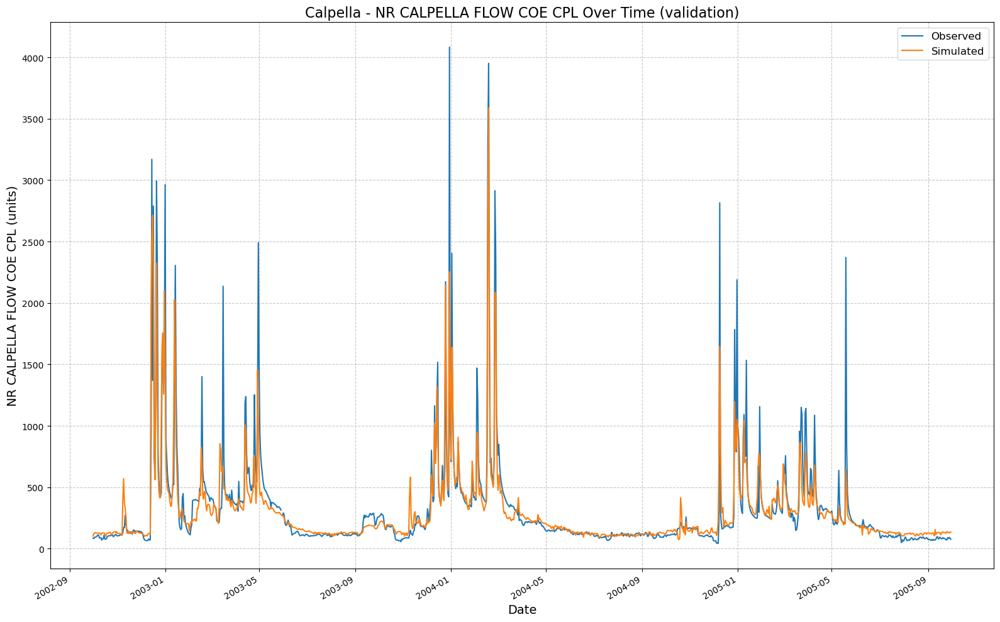

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192110/results_output_validation.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [9]:
if run_gridsearch or not os.path.exists(hyperparam_csv_file):
    for (hs, seq, nl, ep) in itertools.product(
            hyperparam_space["hidden_size"],
            hyperparam_space["seq_length"],
            hyperparam_space["num_layers"],
            hyperparam_space["epochs"]
    ):
        hp = {
            "hidden_size": hs,
            "seq_length": seq,
            "num_layers": nl,
            "epochs": ep,
            "output_dropout": fixed_dropout,
        }
        print(f"NoPhysics: {hp}")
        trainer = UCB_trainer(
            path_to_csv_folder=path_to_csv,
            yaml_path=path_to_yaml,
            hyperparams=hp,
            input_features=None,
            physics_informed=False,
            physics_data_file=None,
            hourly=False,
            extend_train_period=False,
            gpu=-1
        )
        trainer.train()
        csv_path, metrics_dict = trainer.results()
        row_data = {"hidden_size": hs, "seq_length": seq, "num_layers": nl, "epochs": ep, "output_dropout": fixed_dropout}
        for k, v in metrics_dict.items():
            row_data[k] = v
        no_physics_results.append(row_data)
    df_no_physics = pd.DataFrame(no_physics_results)
    df_no_physics.sort_values(by="NSE", ascending=False, inplace=True)
    df_no_physics.reset_index(drop=True, inplace=True)
else:
    print("Skipping Grid-Search")

Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:23:55,920: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192355/output.log initialized.
2025-02-16 19:23:55,921: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192355
2025-02-16 19:23:55,921: ### Run configurations for testing_run
2025-02-16 19:23:55,921: experiment_name: testing_run
2025-02-16 19:23:55,922: train_basin_file: calpella
2025-02-16 19:23:55,922: validation_basin_file: calpella
2025-02-16 19:23:55,922: test_basin_file: calpella
2025-02-16 19:23:55,922: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:23:55,923: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:23:55,923: validation_start_date: 2002-10-01 00:00:00
2025-02-16 19:23:55,923: validation_end_date: 2005-09-30 00:00:00
2025-02-16 19:23:55,923: test_start_date: 20

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]
2025-02-16 19:24:10,430: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192355/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:24:10,431: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192355/validation/model_epoch016/validation_results.p
got predictions


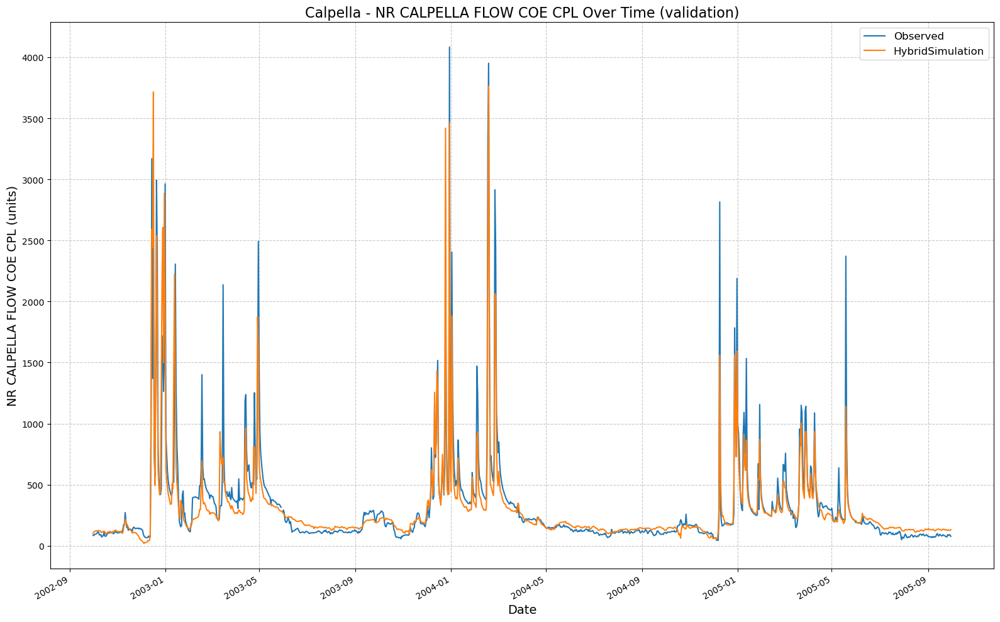

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192355/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:24:10,676: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192410/output.log initialized.
2025-02-16 19:24:10,677: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192410
2025-02-16 19:24:10,677: ### Run configurations for testing_run
2025-02-16 19:24:10,677: experiment_name: testing_run
2025-02-16 19:24:10,678: train_basin_file: calpella
2025-02-16 19:24:10,678: validation_basin_file: calpella
2025-02-16 19:24:10,678: test_basin_file: calpella
2025-02-16 19:24:10,678: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:24:10,679: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:24:10

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.04it/s]
2025-02-16 19:24:10,836: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1404.66it/s]
2025-02-16 19:24:10,842: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 11.63it/s, Loss: 0.0000]
2025-02-16 19:24:11,918: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 12.61it/s, Loss: 0.0000]
2025-02-16 19:24:12,794: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 14.20it/s, Loss: 0.0000]
2025-02-16 19:24:13,571: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 14.07it/s, Loss: 0.0000]
2025-02-16 19:24:14,356: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 12.89it/s, Loss: 0.0000]
2025-02-16 19:24:15,212: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]
2025-02-16 19:24:38,577: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192410/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:24:38,578: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192410/validation/model_epoch032/validation_results.p
got predictions


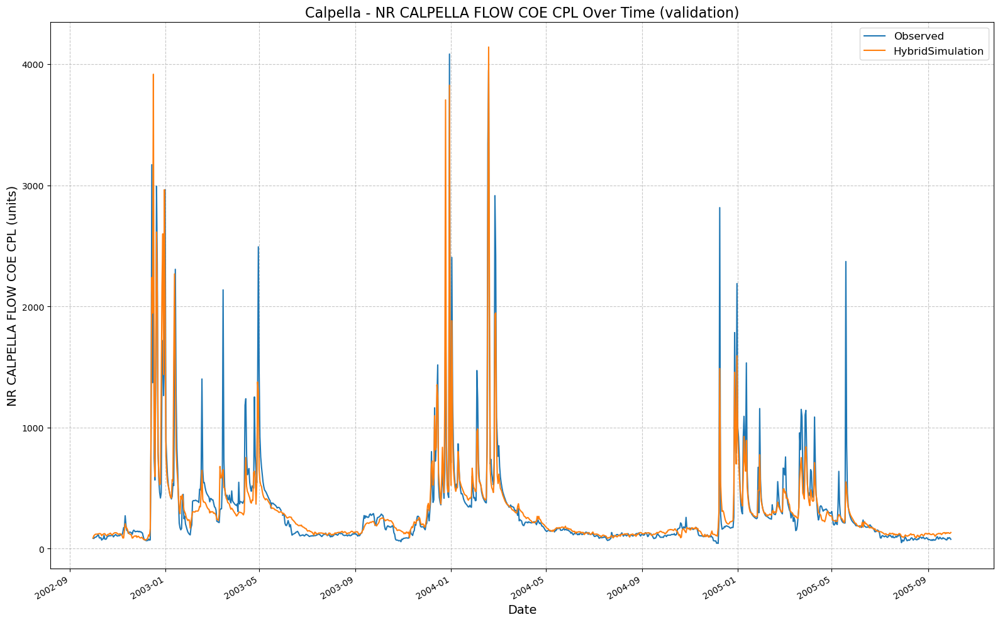

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192410/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:24:38,828: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192438/output.log initialized.
2025-02-16 19:24:38,829: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192438
2025-02-16 19:24:38,829: ### Run configurations for testing_run
2025-02-16 19:24:38,830: experiment_name: testing_run
2025-02-16 19:24:38,831: train_basin_file: calpella
2025-02-16 19:24:38,831: validation_basin_file: calpella
2025-02-16 19:24:38,831: test_basin_file: calpella
2025-02-16 19:24:38,832: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:24:38,832: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:24:38

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2025-02-16 19:24:39,021: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1272.16it/s]
2025-02-16 19:24:39,028: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 13.80it/s, Loss: 0.0000]
2025-02-16 19:24:39,980: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 13.39it/s, Loss: 0.0000]
2025-02-16 19:24:40,804: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.91it/s, Loss: 0.0000]
2025-02-16 19:24:41,917: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 13.34it/s, Loss: 0.0000]
2025-02-16 19:24:42,745: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 13.77it/s, Loss: 0.0000]
2025-02-16 19:24:43,546: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]
2025-02-16 19:24:54,047: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192438/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:24:54,048: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192438/validation/model_epoch016/validation_results.p
got predictions


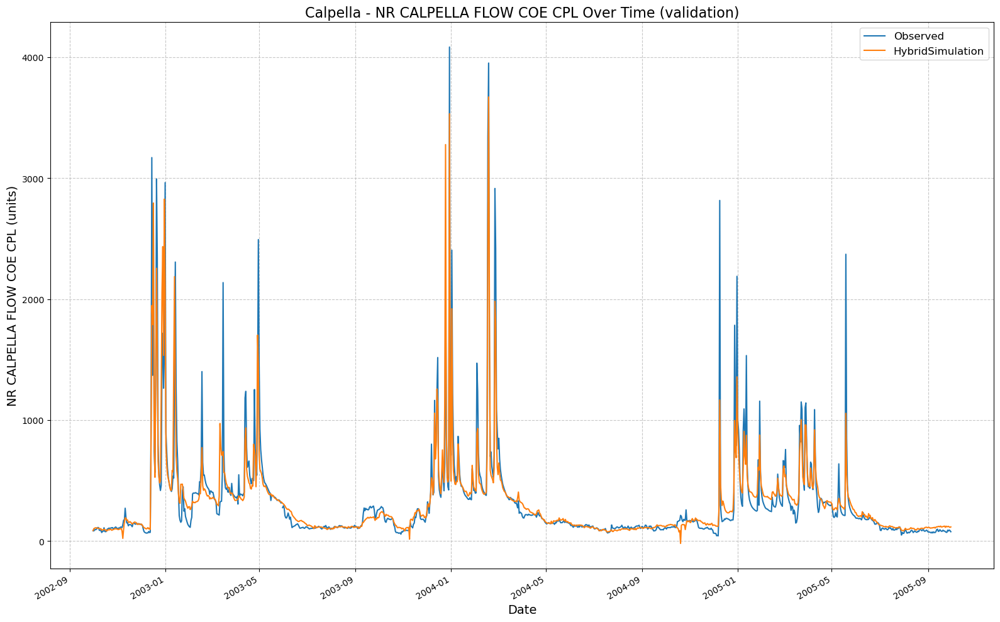

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192438/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:24:54,285: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192454/output.log initialized.
2025-02-16 19:24:54,286: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192454
2025-02-16 19:24:54,286: ### Run configurations for testing_run
2025-02-16 19:24:54,286: experiment_name: testing_run
2025-02-16 19:24:54,286: train_basin_file: calpella
2025-02-16 19:24:54,287: validation_basin_file: calpella
2025-02-16 19:24:54,287: test_basin_file: calpella
2025-02-16 19:24:54,287: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:24:54,287: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:24:54

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.13it/s]
2025-02-16 19:24:54,443: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1387.46it/s]
2025-02-16 19:24:54,448: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 14.05it/s, Loss: 0.0000]
2025-02-16 19:24:55,401: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 15.51it/s, Loss: 0.0000]
2025-02-16 19:24:56,113: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 15.52it/s, Loss: 0.0000]
2025-02-16 19:24:56,824: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 13.82it/s, Loss: 0.0000]
2025-02-16 19:24:57,624: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 13.74it/s, Loss: 0.0000]
2025-02-16 19:24:58,427: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]
2025-02-16 19:25:22,598: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192454/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:25:22,599: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192454/validation/model_epoch032/validation_results.p
got predictions


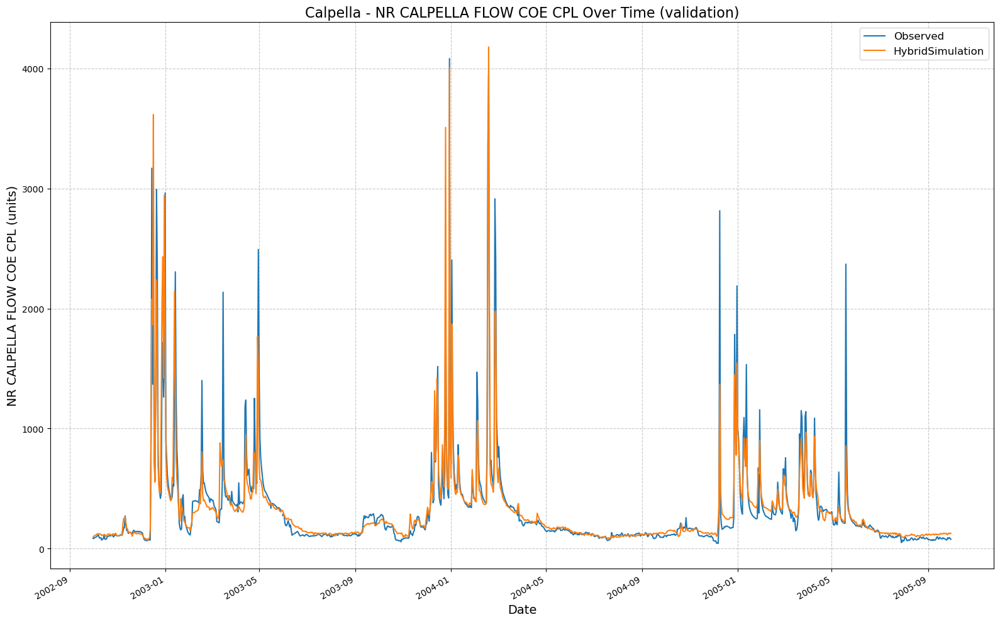

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192454/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:25:22,848: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192522/output.log initialized.
2025-02-16 19:25:22,848: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192522
2025-02-16 19:25:22,849: ### Run configurations for testing_run
2025-02-16 19:25:22,849: experiment_name: testing_run
2025-02-16 19:25:22,849: train_basin_file: calpella
2025-02-16 19:25:22,849: validation_basin_file: calpella
2025-02-16 19:25:22,850: test_basin_file: calpella
2025-02-16 19:25:22,850: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:25:22,850: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:25:2

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.12it/s]
2025-02-16 19:25:23,008: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1202.15it/s]
2025-02-16 19:25:23,013: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  6.99it/s, Loss: 0.0000]
2025-02-16 19:25:24,762: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.49it/s, Loss: 0.0000]
2025-02-16 19:25:26,234: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.43it/s, Loss: 0.0000]
2025-02-16 19:25:27,541: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.83it/s, Loss: 0.0000]
2025-02-16 19:25:28,949: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.32it/s, Loss: 0.0000]
2025-02-16 19:25:30,274: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]
2025-02-16 19:25:48,201: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192522/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:25:48,202: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192522/validation/model_epoch016/validation_results.p
got predictions


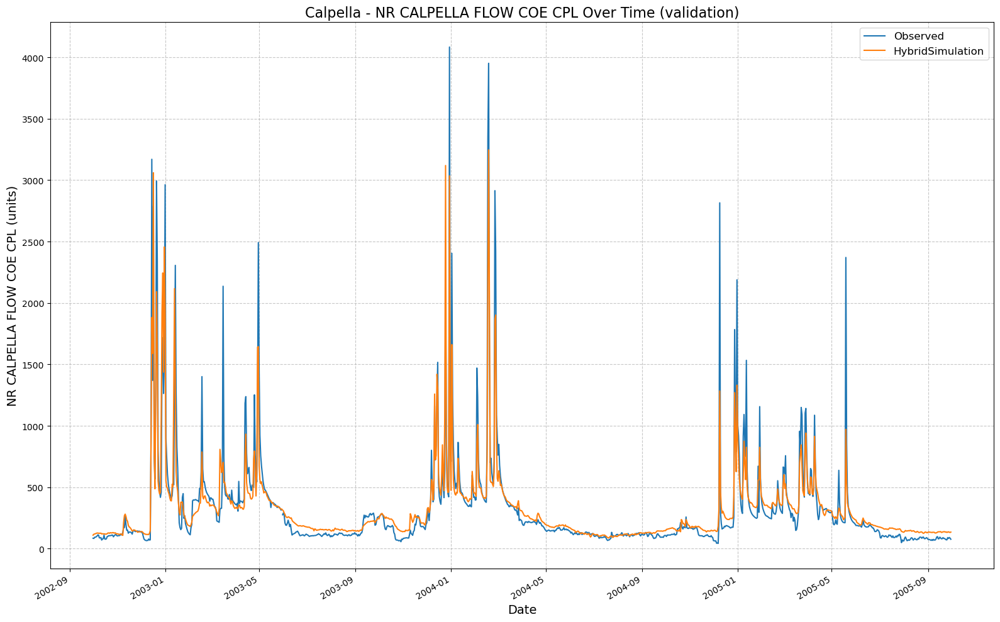

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192522/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:25:48,459: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192548/output.log initialized.
2025-02-16 19:25:48,460: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192548
2025-02-16 19:25:48,460: ### Run configurations for testing_run
2025-02-16 19:25:48,460: experiment_name: testing_run
2025-02-16 19:25:48,460: train_basin_file: calpella
2025-02-16 19:25:48,461: validation_basin_file: calpella
2025-02-16 19:25:48,461: test_basin_file: calpella
2025-02-16 19:25:48,461: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:25:48,461: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:25:4

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.96it/s]
2025-02-16 19:25:48,621: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1240.92it/s]
2025-02-16 19:25:48,627: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.49it/s, Loss: 0.0000]
2025-02-16 19:25:50,256: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.41it/s, Loss: 0.0000]
2025-02-16 19:25:51,743: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.94it/s, Loss: 0.0000]
2025-02-16 19:25:53,133: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.61it/s, Loss: 0.0000]
2025-02-16 19:25:54,581: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.68it/s, Loss: 0.0000]
2025-02-16 19:25:56,016: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]
2025-02-16 19:26:38,042: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192548/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:26:38,044: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192548/validation/model_epoch032/validation_results.p
got predictions


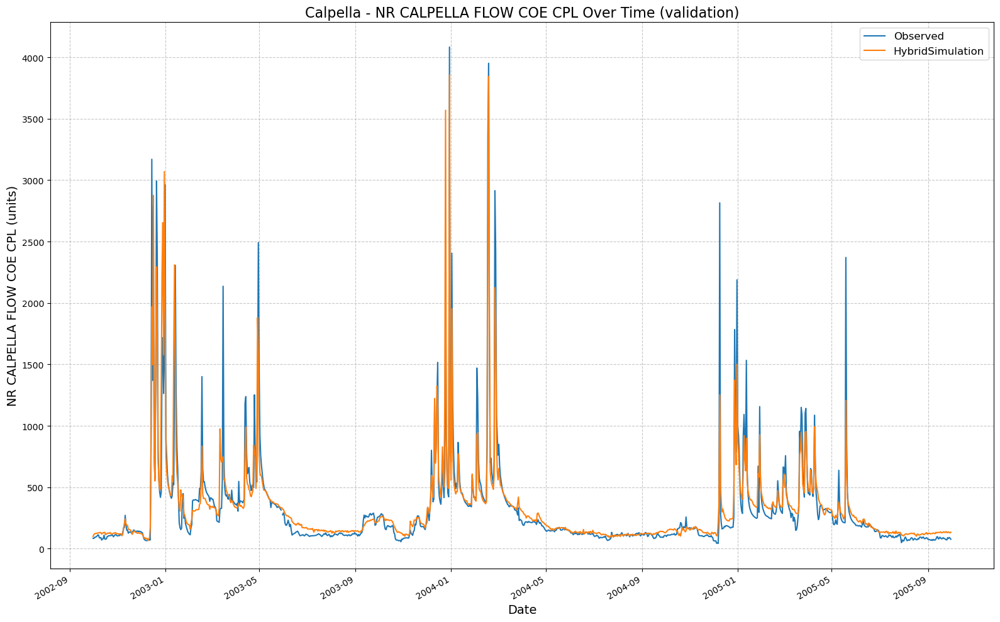

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192548/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:26:38,294: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192638/output.log initialized.
2025-02-16 19:26:38,294: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192638
2025-02-16 19:26:38,294: ### Run configurations for testing_run
2025-02-16 19:26:38,295: experiment_name: testing_run
2025-02-16 19:26:38,295: train_basin_file: calpella
2025-02-16 19:26:38,295: validation_basin_file: calpella
2025-02-16 19:26:38,295: test_basin_file: calpella
2025-02-16 19:26:38,296: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:26:38,296: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:26:3

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.17it/s]
2025-02-16 19:26:38,453: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1202.15it/s]
2025-02-16 19:26:38,459: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.15it/s, Loss: 0.0000]
2025-02-16 19:26:40,162: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.69it/s, Loss: 0.0000]
2025-02-16 19:26:41,595: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.73it/s, Loss: 0.0000]
2025-02-16 19:26:43,021: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.68it/s, Loss: 0.0000]
2025-02-16 19:26:44,458: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.73it/s, Loss: 0.0000]
2025-02-16 19:26:45,883: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]
2025-02-16 19:27:03,863: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192638/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:27:03,865: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192638/validation/model_epoch016/validation_results.p
got predictions


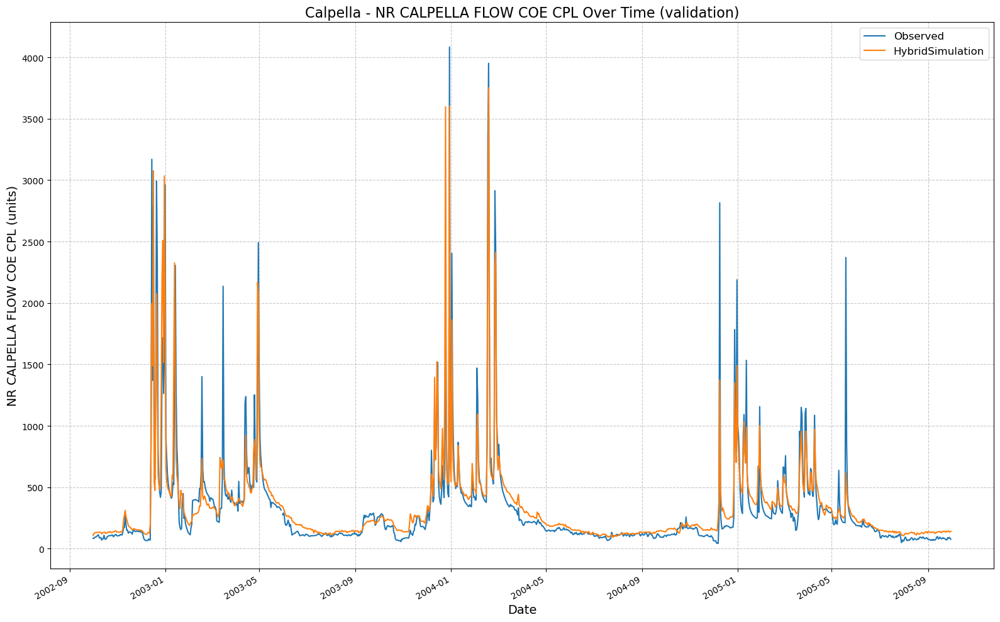

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192638/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:27:04,104: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192704/output.log initialized.
2025-02-16 19:27:04,104: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192704
2025-02-16 19:27:04,105: ### Run configurations for testing_run
2025-02-16 19:27:04,105: experiment_name: testing_run
2025-02-16 19:27:04,105: train_basin_file: calpella
2025-02-16 19:27:04,106: validation_basin_file: calpella
2025-02-16 19:27:04,106: test_basin_file: calpella
2025-02-16 19:27:04,106: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:27:04,107: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:27:0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.44it/s]
2025-02-16 19:27:04,257: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1369.79it/s]
2025-02-16 19:27:04,262: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.95it/s, Loss: 0.0000]
2025-02-16 19:27:05,783: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.93it/s, Loss: 0.0000]
2025-02-16 19:27:07,173: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.81it/s, Loss: 0.0000]
2025-02-16 19:27:08,586: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.50it/s, Loss: 0.0000]
2025-02-16 19:27:10,057: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  6.05it/s, Loss: 0.0000]
2025-02-16 19:27:11,878: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]
2025-02-16 19:27:50,252: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192704/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:27:50,253: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192704/validation/model_epoch032/validation_results.p
got predictions


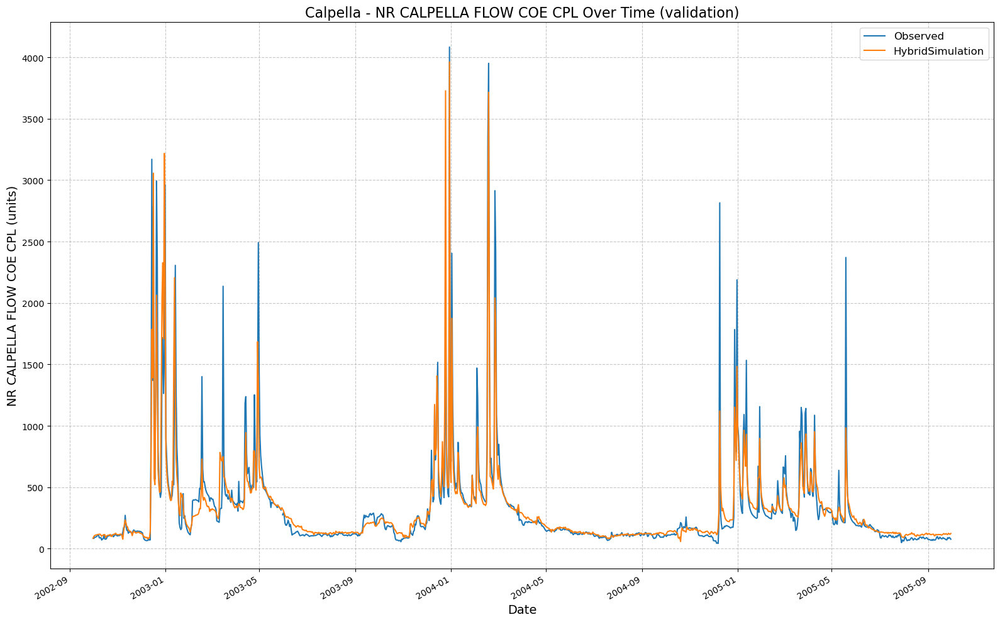

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192704/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:27:50,487: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192750/output.log initialized.
2025-02-16 19:27:50,488: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192750
2025-02-16 19:27:50,489: ### Run configurations for testing_run
2025-02-16 19:27:50,489: experiment_name: testing_run
2025-02-16 19:27:50,489: train_basin_file: calpella
2025-02-16 19:27:50,490: validation_basin_file: calpella
2025-02-16 19:27:50,490: test_basin_file: calpella
2025-02-16 19:27:50,491: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:27:50,491: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:27:5

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.36it/s]
2025-02-16 19:27:50,645: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1227.48it/s]
2025-02-16 19:27:50,650: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.57it/s, Loss: 0.0000]
2025-02-16 19:27:51,933: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00, 10.08it/s, Loss: 0.0000]
2025-02-16 19:27:53,026: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00, 10.54it/s, Loss: 0.0000]
2025-02-16 19:27:54,072: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00, 10.78it/s, Loss: 0.0000]
2025-02-16 19:27:55,094: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.60it/s, Loss: 0.0000]
2025-02-16 19:27:56,376: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]
2025-02-16 19:28:10,603: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192750/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:28:10,604: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192750/validation/model_epoch016/validation_results.p
got predictions


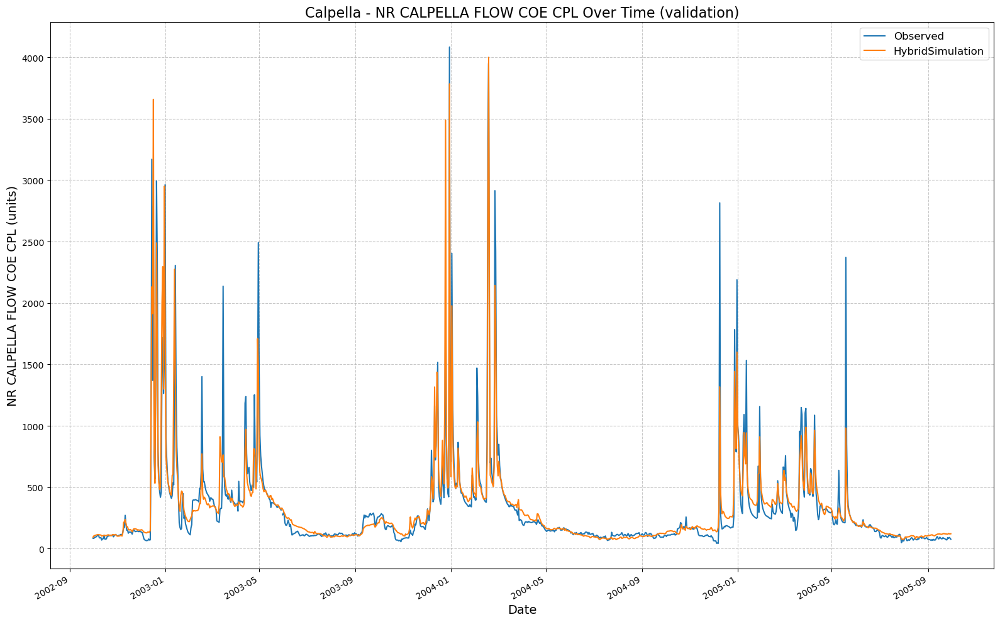

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192750/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:28:10,885: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192810/output.log initialized.
2025-02-16 19:28:10,886: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192810
2025-02-16 19:28:10,886: ### Run configurations for testing_run
2025-02-16 19:28:10,886: experiment_name: testing_run
2025-02-16 19:28:10,887: train_basin_file: calpella
2025-02-16 19:28:10,887: validation_basin_file: calpella
2025-02-16 19:28:10,887: test_basin_file: calpella
2025-02-16 19:28:10,887: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:28:10,888: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:28:1

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.37it/s]
2025-02-16 19:28:11,039: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1239.45it/s]
2025-02-16 19:28:11,045: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.86it/s, Loss: 0.0000]
2025-02-16 19:28:12,292: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00, 10.62it/s, Loss: 0.0000]
2025-02-16 19:28:13,330: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.32it/s, Loss: 0.0000]
2025-02-16 19:28:14,655: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.55it/s, Loss: 0.0000]
2025-02-16 19:28:15,809: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00, 10.27it/s, Loss: 0.0000]
2025-02-16 19:28:16,883: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]
2025-02-16 19:28:49,863: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192810/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:28:49,864: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192810/validation/model_epoch032/validation_results.p
got predictions


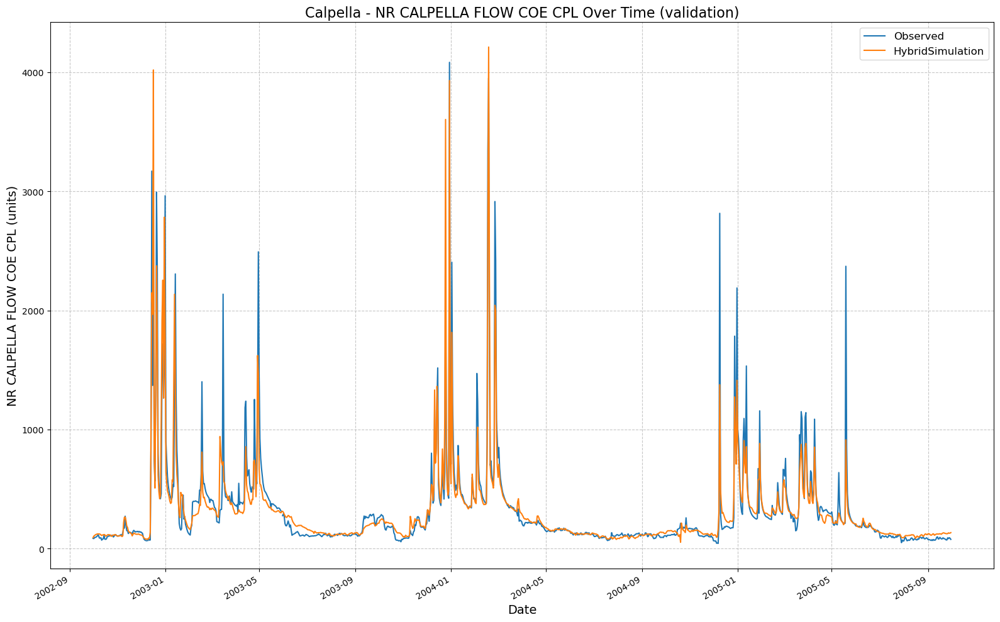

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192810/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:28:50,092: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192850/output.log initialized.
2025-02-16 19:28:50,093: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192850
2025-02-16 19:28:50,093: ### Run configurations for testing_run
2025-02-16 19:28:50,093: experiment_name: testing_run
2025-02-16 19:28:50,094: train_basin_file: calpella
2025-02-16 19:28:50,094: validation_basin_file: calpella
2025-02-16 19:28:50,094: test_basin_file: calpella
2025-02-16 19:28:50,095: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:28:50,095: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:28:5

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.00it/s]
2025-02-16 19:28:50,256: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1349.52it/s]
2025-02-16 19:28:50,261: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00, 10.25it/s, Loss: 0.0000]
2025-02-16 19:28:51,450: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.57it/s, Loss: 0.0000]
2025-02-16 19:28:52,602: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.94it/s, Loss: 0.0000]
2025-02-16 19:28:53,836: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.91it/s, Loss: 0.0000]
2025-02-16 19:28:55,074: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.15it/s, Loss: 0.0000]
2025-02-16 19:28:56,427: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]
2025-02-16 19:29:10,503: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192850/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:29:10,503: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192850/validation/model_epoch016/validation_results.p
got predictions


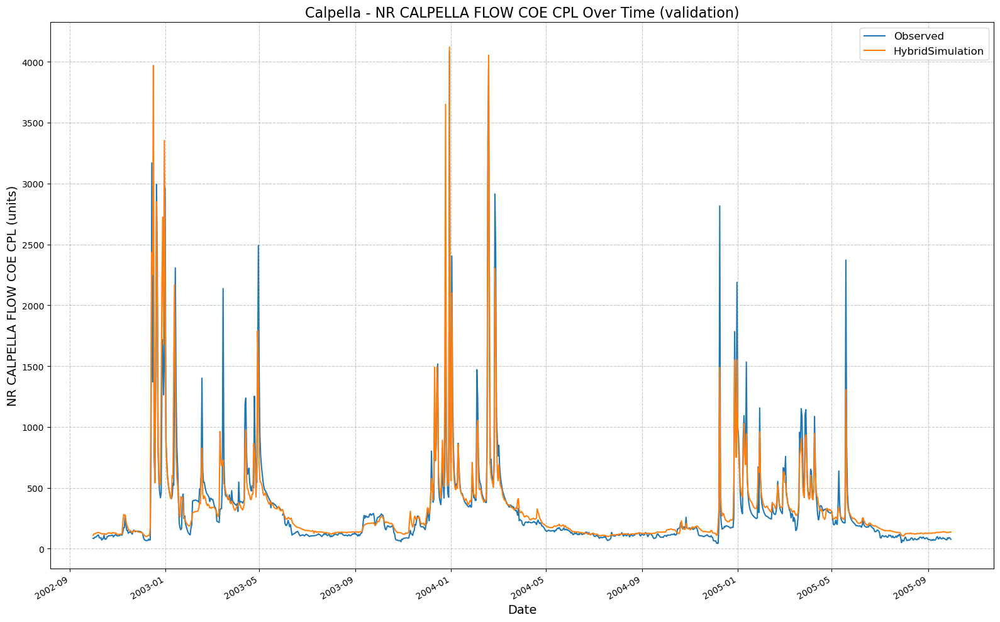

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192850/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:29:10,738: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192910/output.log initialized.
2025-02-16 19:29:10,738: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192910
2025-02-16 19:29:10,739: ### Run configurations for testing_run
2025-02-16 19:29:10,739: experiment_name: testing_run
2025-02-16 19:29:10,739: train_basin_file: calpella
2025-02-16 19:29:10,740: validation_basin_file: calpella
2025-02-16 19:29:10,740: test_basin_file: calpella
2025-02-16 19:29:10,740: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:29:10,741: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:29:1

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.05it/s]
2025-02-16 19:29:10,899: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1276.03it/s]
2025-02-16 19:29:10,904: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.47it/s, Loss: 0.0000]
2025-02-16 19:29:12,200: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00, 10.75it/s, Loss: 0.0000]
2025-02-16 19:29:13,226: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00, 10.86it/s, Loss: 0.0000]
2025-02-16 19:29:14,241: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.72it/s, Loss: 0.0000]
2025-02-16 19:29:15,669: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.74it/s, Loss: 0.0000]
2025-02-16 19:29:16,930: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]
2025-02-16 19:29:51,528: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192910/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:29:51,529: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192910/validation/model_epoch032/validation_results.p
got predictions


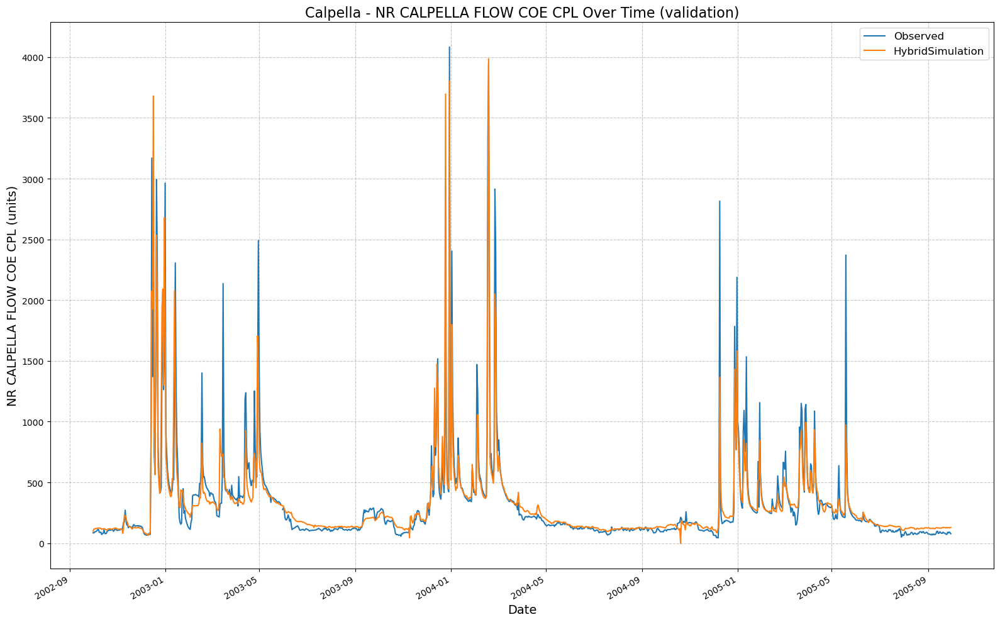

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192910/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:29:51,763: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192951/output.log initialized.
2025-02-16 19:29:51,764: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192951
2025-02-16 19:29:51,764: ### Run configurations for testing_run
2025-02-16 19:29:51,764: experiment_name: testing_run
2025-02-16 19:29:51,765: train_basin_file: calpella
2025-02-16 19:29:51,765: validation_basin_file: calpella
2025-02-16 19:29:51,766: test_basin_file: calpella
2025-02-16 19:29:51,766: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:29:51,766: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:29:

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.30it/s]
2025-02-16 19:29:51,921: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1277.19it/s]
2025-02-16 19:29:51,926: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.64it/s, Loss: 0.0000]
2025-02-16 19:29:54,437: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.21it/s, Loss: 0.0000]
2025-02-16 19:29:57,059: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.72it/s, Loss: 0.0000]
2025-02-16 19:29:59,395: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.52it/s, Loss: 0.0000]
2025-02-16 19:30:01,830: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.75it/s, Loss: 0.0000]
2025-02-16 19:30:04,147: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]
2025-02-16 19:30:33,533: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192951/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:30:33,534: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192951/validation/model_epoch016/validation_results.p
got predictions


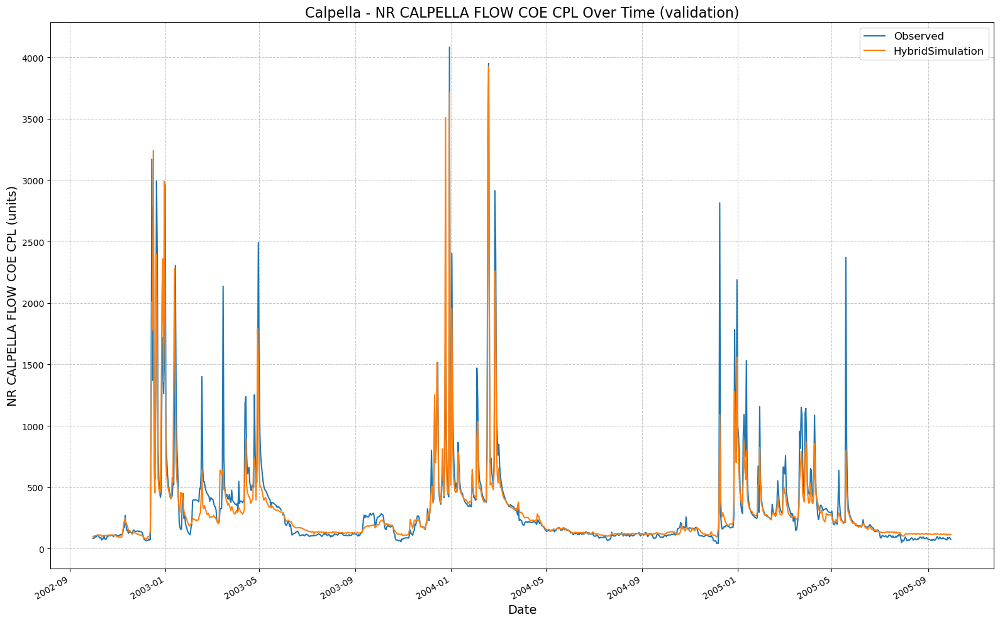

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_192951/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:30:33,771: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193033/output.log initialized.
2025-02-16 19:30:33,771: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193033
2025-02-16 19:30:33,772: ### Run configurations for testing_run
2025-02-16 19:30:33,772: experiment_name: testing_run
2025-02-16 19:30:33,772: train_basin_file: calpella
2025-02-16 19:30:33,773: validation_basin_file: calpella
2025-02-16 19:30:33,773: test_basin_file: calpella
2025-02-16 19:30:33,773: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:30:33,774: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:30:

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.12it/s]
2025-02-16 19:30:33,930: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1329.84it/s]
2025-02-16 19:30:33,935: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.80it/s, Loss: 0.0000]
2025-02-16 19:30:36,386: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.33it/s, Loss: 0.0000]
2025-02-16 19:30:38,930: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  5.23it/s, Loss: 0.0000]
2025-02-16 19:30:41,038: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.77it/s, Loss: 0.0000]
2025-02-16 19:30:43,349: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.94it/s, Loss: 0.0000]
2025-02-16 19:30:45,579: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]
2025-02-16 19:31:52,330: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193033/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:31:52,331: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193033/validation/model_epoch032/validation_results.p
got predictions


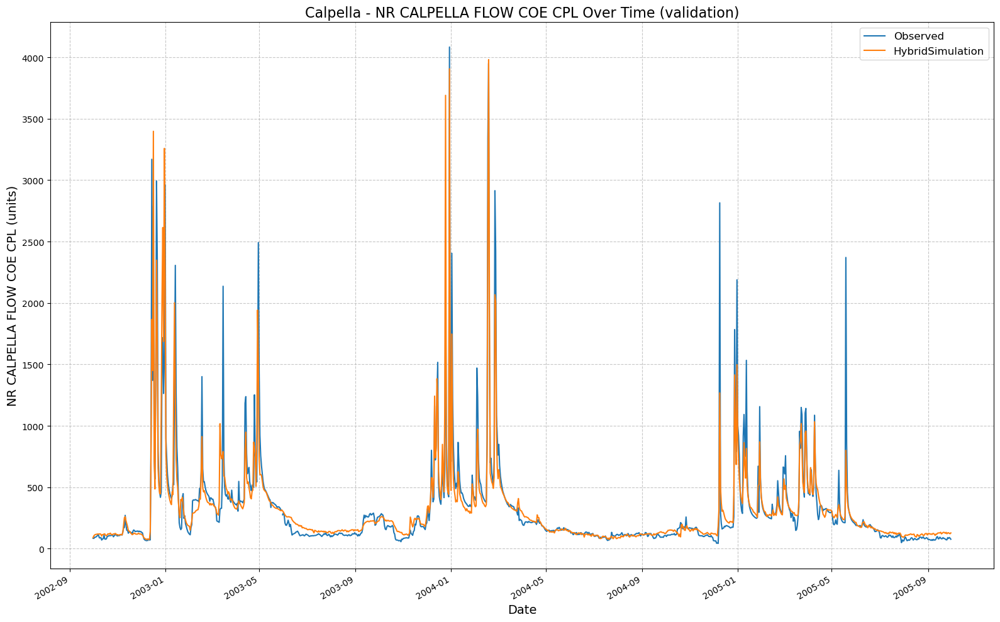

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193033/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:31:52,574: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193152/output.log initialized.
2025-02-16 19:31:52,575: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193152
2025-02-16 19:31:52,575: ### Run configurations for testing_run
2025-02-16 19:31:52,575: experiment_name: testing_run
2025-02-16 19:31:52,576: train_basin_file: calpella
2025-02-16 19:31:52,576: validation_basin_file: calpella
2025-02-16 19:31:52,576: test_basin_file: calpella
2025-02-16 19:31:52,576: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:31:52,577: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:31:

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.20it/s]
2025-02-16 19:31:52,733: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1222.83it/s]
2025-02-16 19:31:52,738: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  5.03it/s, Loss: 0.0000]
2025-02-16 19:31:55,064: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  5.10it/s, Loss: 0.0000]
2025-02-16 19:31:57,226: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.43it/s, Loss: 0.0000]
2025-02-16 19:31:59,710: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.87it/s, Loss: 0.0000]
2025-02-16 19:32:01,972: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  5.29it/s, Loss: 0.0000]
2025-02-16 19:32:04,053: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]
2025-02-16 19:32:31,701: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193152/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:32:31,702: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193152/validation/model_epoch016/validation_results.p
got predictions


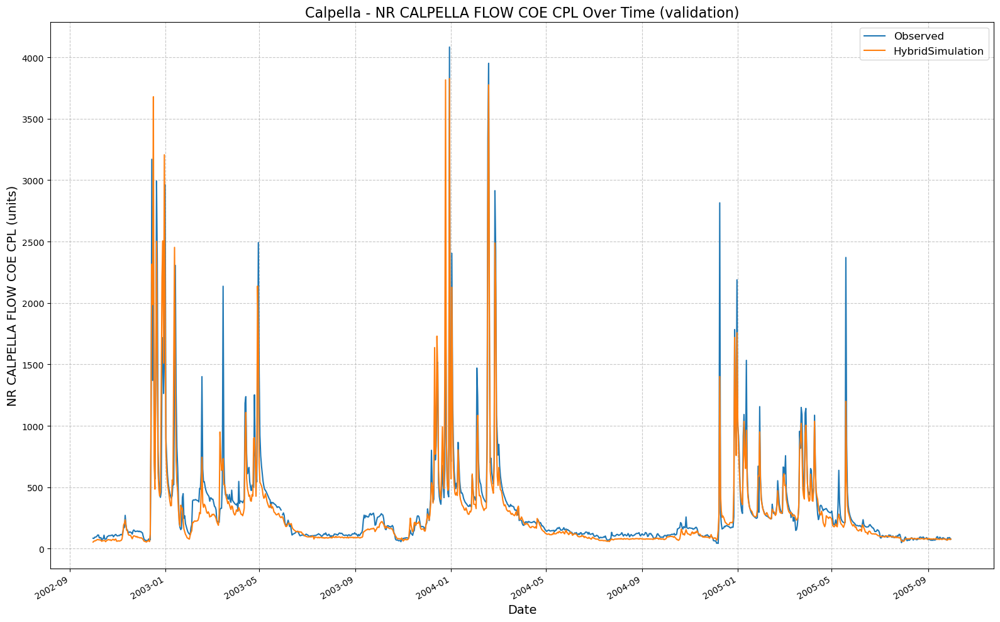

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193152/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:32:31,942: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193231/output.log initialized.
2025-02-16 19:32:31,942: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193231
2025-02-16 19:32:31,943: ### Run configurations for testing_run
2025-02-16 19:32:31,943: experiment_name: testing_run
2025-02-16 19:32:31,944: train_basin_file: calpella
2025-02-16 19:32:31,944: validation_basin_file: calpella
2025-02-16 19:32:31,944: test_basin_file: calpella
2025-02-16 19:32:31,944: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:32:31,945: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:32:

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.32it/s]
2025-02-16 19:32:32,099: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1160.25it/s]
2025-02-16 19:32:32,104: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.94it/s, Loss: 0.0000]
2025-02-16 19:32:34,473: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.44it/s, Loss: 0.0000]
2025-02-16 19:32:36,956: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  5.13it/s, Loss: 0.0000]
2025-02-16 19:32:39,104: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.87it/s, Loss: 0.0000]
2025-02-16 19:32:41,367: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.83it/s, Loss: 0.0000]
2025-02-16 19:32:43,650: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]
2025-02-16 19:33:51,547: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193231/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:33:51,548: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193231/validation/model_epoch032/validation_results.p
got predictions


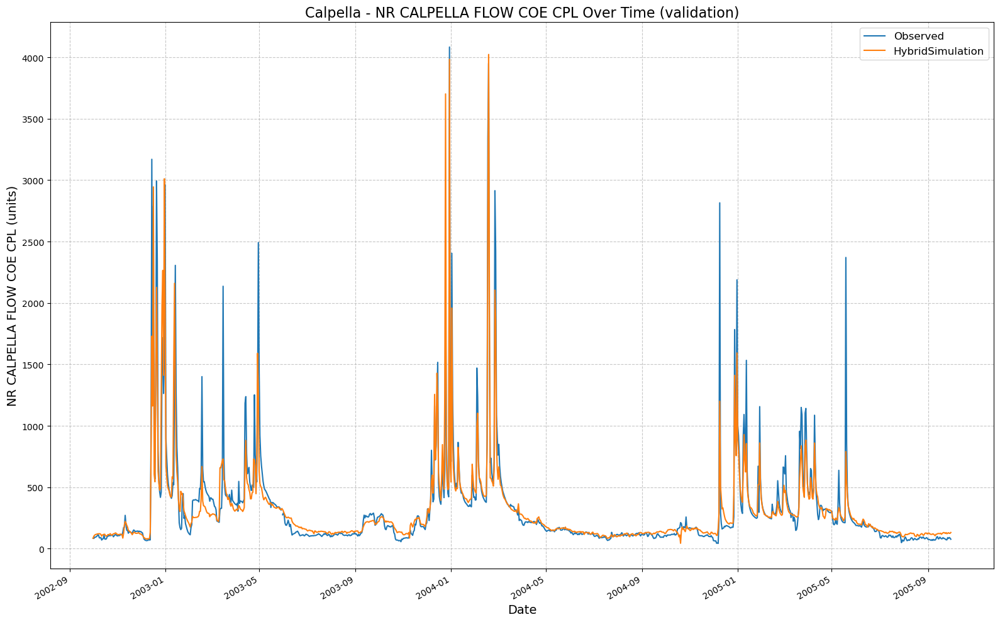

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193231/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:33:51,804: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193351/output.log initialized.
2025-02-16 19:33:51,805: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193351
2025-02-16 19:33:51,805: ### Run configurations for testing_run
2025-02-16 19:33:51,806: experiment_name: testing_run
2025-02-16 19:33:51,806: train_basin_file: calpella
2025-02-16 19:33:51,807: validation_basin_file: calpella
2025-02-16 19:33:51,808: test_basin_file: calpella
2025-02-16 19:33:51,808: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:33:51,809: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:33:5

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.89it/s]
2025-02-16 19:33:51,985: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1112.55it/s]
2025-02-16 19:33:51,992: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.07it/s, Loss: 0.0000]
2025-02-16 19:33:54,848: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  3.67it/s, Loss: 0.0000]
2025-02-16 19:33:57,851: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.92it/s, Loss: 0.0000]
2025-02-16 19:34:00,092: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.43it/s, Loss: 0.0000]
2025-02-16 19:34:02,575: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.64it/s, Loss: 0.0000]
2025-02-16 19:34:04,951: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]
2025-02-16 19:34:33,457: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193351/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:34:33,458: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193351/validation/model_epoch016/validation_results.p
got predictions


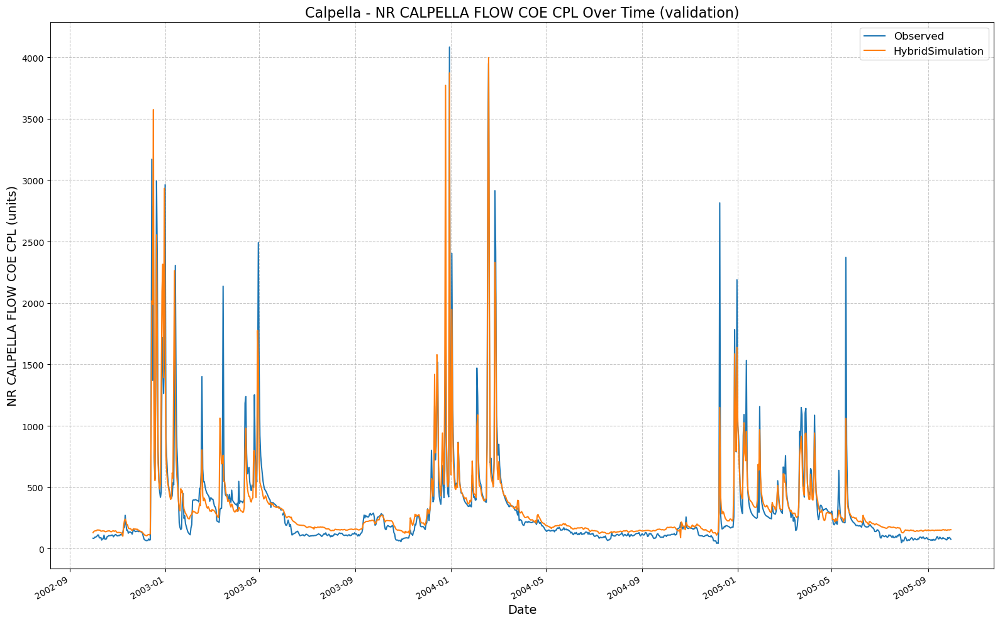

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193351/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:34:33,691: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193433/output.log initialized.
2025-02-16 19:34:33,691: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193433
2025-02-16 19:34:33,692: ### Run configurations for testing_run
2025-02-16 19:34:33,692: experiment_name: testing_run
2025-02-16 19:34:33,693: train_basin_file: calpella
2025-02-16 19:34:33,693: validation_basin_file: calpella
2025-02-16 19:34:33,693: test_basin_file: calpella
2025-02-16 19:34:33,694: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:34:33,694: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:34:3

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.09it/s]
2025-02-16 19:34:33,853: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1360.46it/s]
2025-02-16 19:34:33,858: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.63it/s, Loss: 0.0000]
2025-02-16 19:34:36,381: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  5.11it/s, Loss: 0.0000]
2025-02-16 19:34:38,538: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.87it/s, Loss: 0.0000]
2025-02-16 19:34:40,798: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.62it/s, Loss: 0.0000]
2025-02-16 19:34:43,183: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.62it/s, Loss: 0.0000]
2025-02-16 19:34:46,228: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]
2025-02-16 19:35:54,042: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193433/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:35:54,043: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193433/validation/model_epoch032/validation_results.p
got predictions


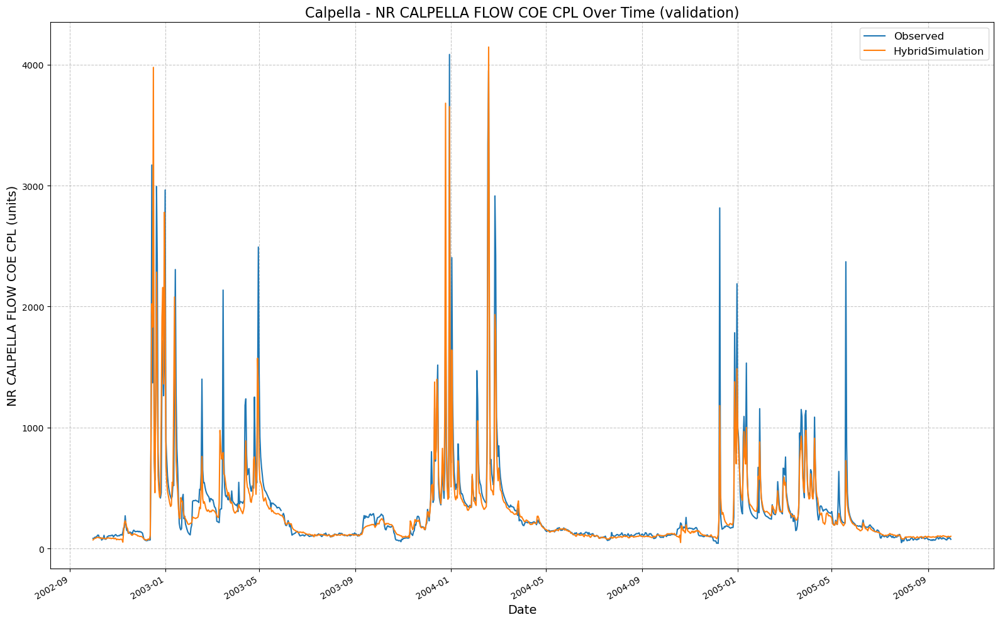

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193433/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:35:54,267: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193554/output.log initialized.
2025-02-16 19:35:54,268: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193554
2025-02-16 19:35:54,268: ### Run configurations for testing_run
2025-02-16 19:35:54,269: experiment_name: testing_run
2025-02-16 19:35:54,269: train_basin_file: calpella
2025-02-16 19:35:54,269: validation_basin_file: calpella
2025-02-16 19:35:54,270: test_basin_file: calpella
2025-02-16 19:35:54,270: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:35:54,270: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:35:5

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.13it/s]
2025-02-16 19:35:54,430: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1355.19it/s]
2025-02-16 19:35:54,435: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.59it/s, Loss: 0.0000]
2025-02-16 19:35:56,973: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  5.06it/s, Loss: 0.0000]
2025-02-16 19:35:59,148: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.19it/s, Loss: 0.0000]
2025-02-16 19:36:01,777: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.79it/s, Loss: 0.0000]
2025-02-16 19:36:04,076: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.79it/s, Loss: 0.0000]
2025-02-16 19:36:06,374: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]
2025-02-16 19:36:34,949: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193554/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:36:34,950: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193554/validation/model_epoch016/validation_results.p
got predictions


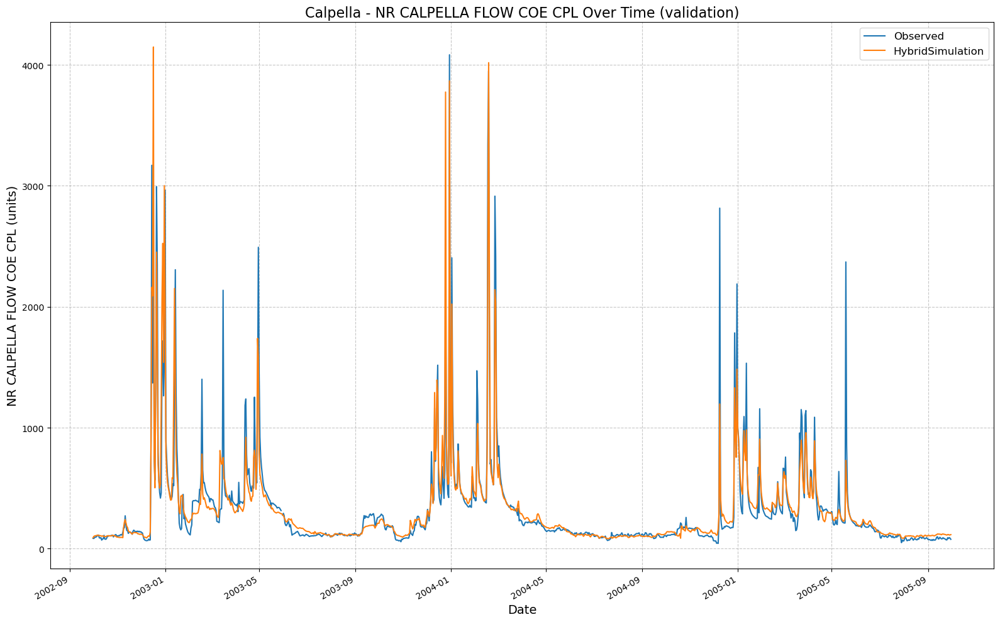

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193554/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:36:35,206: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193635/output.log initialized.
2025-02-16 19:36:35,207: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193635
2025-02-16 19:36:35,207: ### Run configurations for testing_run
2025-02-16 19:36:35,208: experiment_name: testing_run
2025-02-16 19:36:35,208: train_basin_file: calpella
2025-02-16 19:36:35,209: validation_basin_file: calpella
2025-02-16 19:36:35,209: test_basin_file: calpella
2025-02-16 19:36:35,210: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:36:35,210: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:36:3

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2025-02-16 19:36:35,410: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1077.67it/s]
2025-02-16 19:36:35,417: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  5.10it/s, Loss: 0.0000]
2025-02-16 19:36:37,731: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.74it/s, Loss: 0.0000]
2025-02-16 19:36:40,054: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.91it/s, Loss: 0.0000]
2025-02-16 19:36:42,299: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.98it/s, Loss: 0.0000]
2025-02-16 19:36:44,510: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.79it/s, Loss: 0.0000]
2025-02-16 19:36:46,809: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]
2025-02-16 19:37:54,801: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193635/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:37:54,802: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193635/validation/model_epoch032/validation_results.p
got predictions


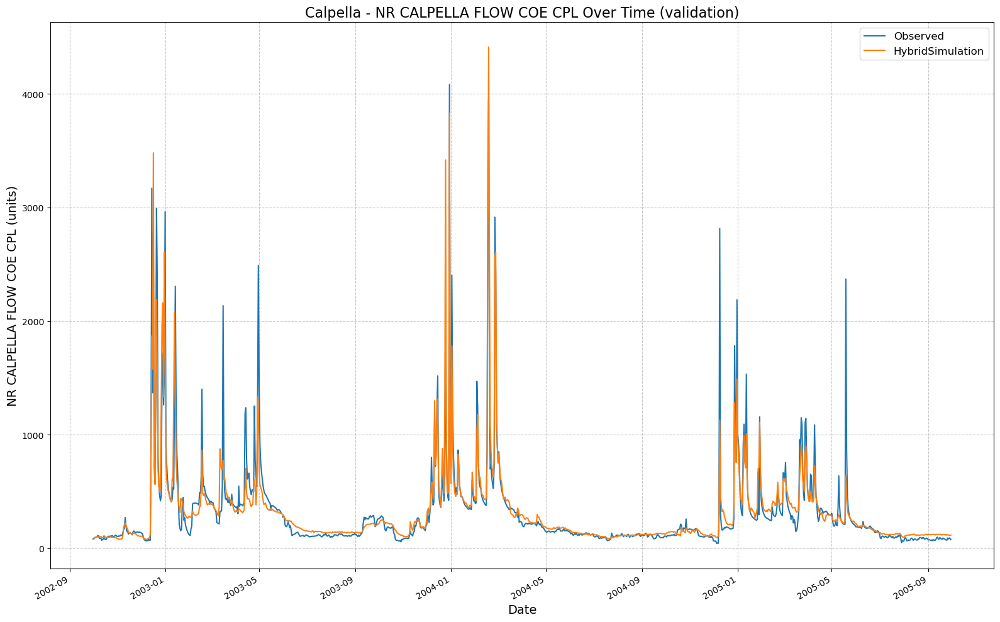

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193635/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:37:55,030: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193755/output.log initialized.
2025-02-16 19:37:55,030: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193755
2025-02-16 19:37:55,031: ### Run configurations for testing_run
2025-02-16 19:37:55,031: experiment_name: testing_run
2025-02-16 19:37:55,032: train_basin_file: calpella
2025-02-16 19:37:55,032: validation_basin_file: calpella
2025-02-16 19:37:55,033: test_basin_file: calpella
2025-02-16 19:37:55,033: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:37:55,033: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:37:

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.31it/s]
2025-02-16 19:37:55,190: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1364.45it/s]
2025-02-16 19:37:55,195: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:04<00:00,  2.23it/s, Loss: 0.0000]
2025-02-16 19:38:00,265: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.09it/s, Loss: 0.0000]
2025-02-16 19:38:05,527: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  2.04it/s, Loss: 0.0000]
2025-02-16 19:38:10,918: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.16it/s, Loss: 0.0000]
2025-02-16 19:38:16,007: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.28it/s, Loss: 0.0000]
2025-02-16 19:38:20,830: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]
2025-02-16 19:39:22,187: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193755/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:39:22,188: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193755/validation/model_epoch016/validation_results.p
got predictions


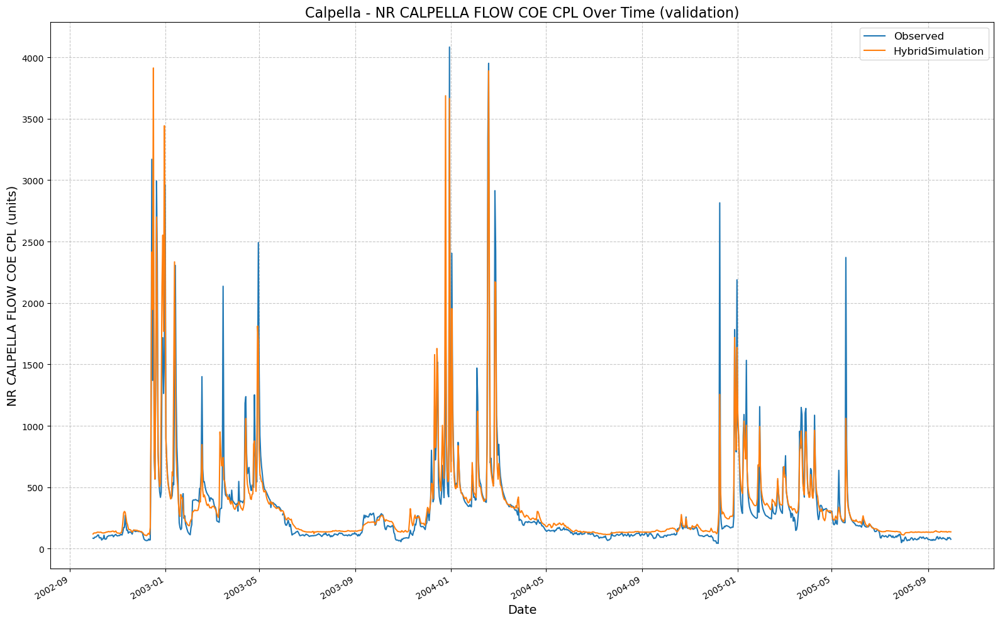

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193755/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:39:22,459: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193922/output.log initialized.
2025-02-16 19:39:22,459: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193922
2025-02-16 19:39:22,460: ### Run configurations for testing_run
2025-02-16 19:39:22,460: experiment_name: testing_run
2025-02-16 19:39:22,461: train_basin_file: calpella
2025-02-16 19:39:22,461: validation_basin_file: calpella
2025-02-16 19:39:22,462: test_basin_file: calpella
2025-02-16 19:39:22,462: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:39:22,463: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:39:

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.83it/s]
2025-02-16 19:39:22,639: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1315.65it/s]
2025-02-16 19:39:22,645: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.19it/s, Loss: 0.0000]
2025-02-16 19:39:27,821: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.05it/s, Loss: 0.0000]
2025-02-16 19:39:33,182: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  2.17it/s, Loss: 0.0000]
2025-02-16 19:39:38,253: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.17it/s, Loss: 0.0000]
2025-02-16 19:39:43,318: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.22it/s, Loss: 0.0000]
2025-02-16 19:39:48,272: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]
2025-02-16 19:42:06,677: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193922/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:42:06,678: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193922/validation/model_epoch032/validation_results.p
got predictions


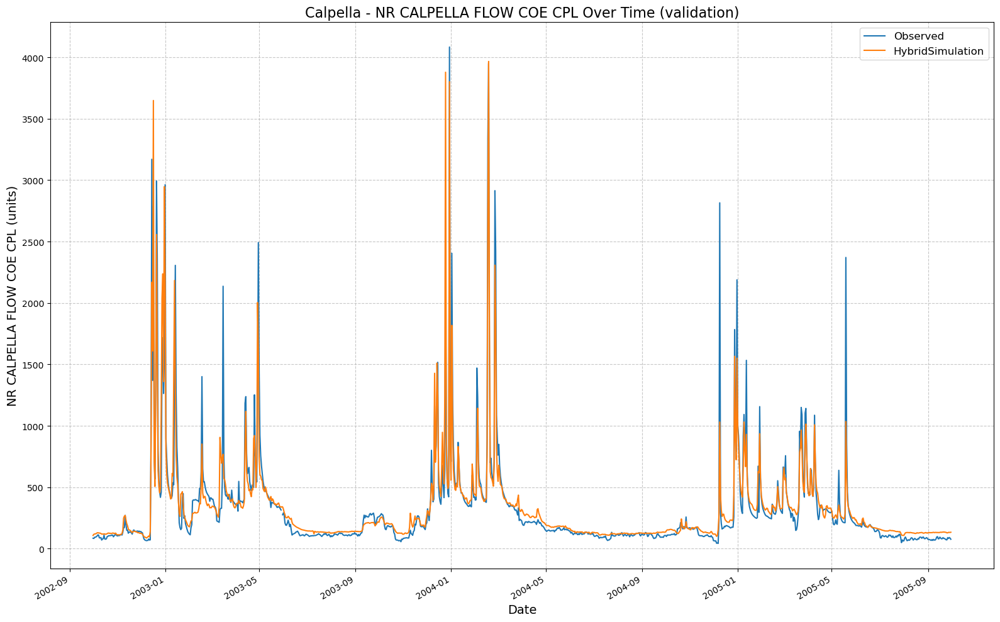

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_193922/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4}
2025-02-16 19:42:06,923: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194206/output.log initialized.
2025-02-16 19:42:06,923: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194206
2025-02-16 19:42:06,924: ### Run configurations for testing_run
2025-02-16 19:42:06,924: experiment_name: testing_run
2025-02-16 19:42:06,924: train_basin_file: calpella
2025-02-16 19:42:06,924: validation_basin_file: calpella
2025-02-16 19:42:06,925: test_basin_file: calpella
2025-02-16 19:42:06,925: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:42:06,925: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:42:

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.79it/s]
2025-02-16 19:42:07,091: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1058.37it/s]
2025-02-16 19:42:07,097: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:04<00:00,  2.28it/s, Loss: 0.0000]
2025-02-16 19:42:12,068: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:04<00:00,  2.25it/s, Loss: 0.0000]
2025-02-16 19:42:16,955: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:04<00:00,  2.40it/s, Loss: 0.0000]
2025-02-16 19:42:21,549: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:04<00:00,  2.49it/s, Loss: 0.0000]
2025-02-16 19:42:25,975: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.30it/s, Loss: 0.0000]
2025-02-16 19:42:30,761: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]
2025-02-16 19:43:27,028: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194206/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:43:27,029: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194206/validation/model_epoch016/validation_results.p
got predictions


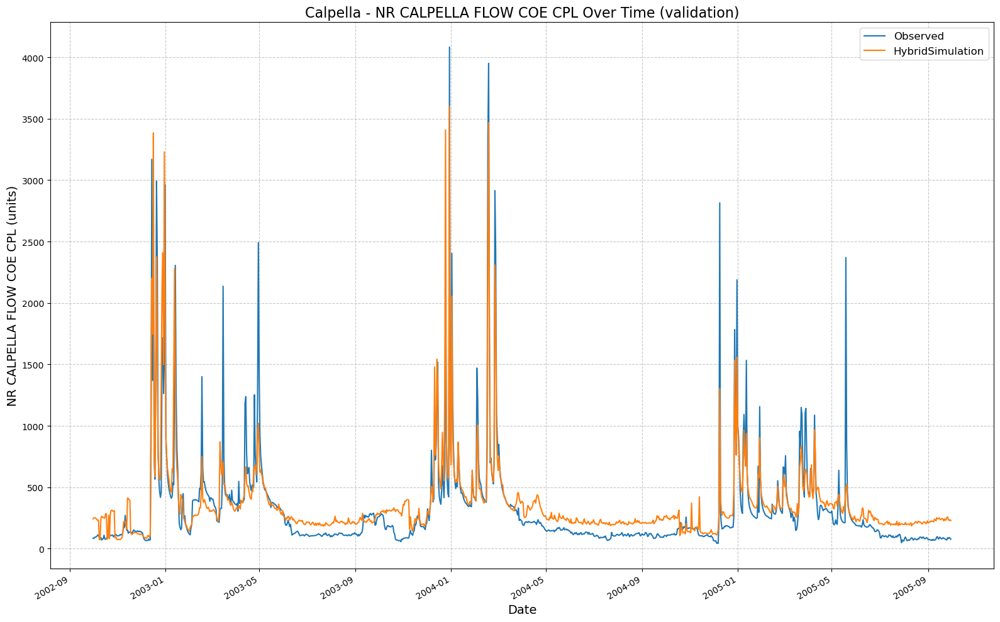

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194206/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4}
2025-02-16 19:43:27,273: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194327/output.log initialized.
2025-02-16 19:43:27,274: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194327
2025-02-16 19:43:27,274: ### Run configurations for testing_run
2025-02-16 19:43:27,274: experiment_name: testing_run
2025-02-16 19:43:27,275: train_basin_file: calpella
2025-02-16 19:43:27,275: validation_basin_file: calpella
2025-02-16 19:43:27,275: test_basin_file: calpella
2025-02-16 19:43:27,275: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:43:27,275: train_end_date: 2002-09-30 00:00:00
2025-02-16 19:43:

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2025-02-16 19:43:27,459: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1351.26it/s]
2025-02-16 19:43:27,465: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.08it/s, Loss: 0.0000]
2025-02-16 19:43:32,972: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:04<00:00,  2.36it/s, Loss: 0.0000]
2025-02-16 19:43:37,637: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:04<00:00,  2.46it/s, Loss: 0.0000]
2025-02-16 19:43:42,113: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:04<00:00,  2.45it/s, Loss: 0.0000]
2025-02-16 19:43:46,613: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.45it/s, Loss: 0.0000]
2025-02-16 19:43:51,110: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]
2025-02-16 19:46:06,649: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194327/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:46:06,650: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194327/validation/model_epoch032/validation_results.p
got predictions


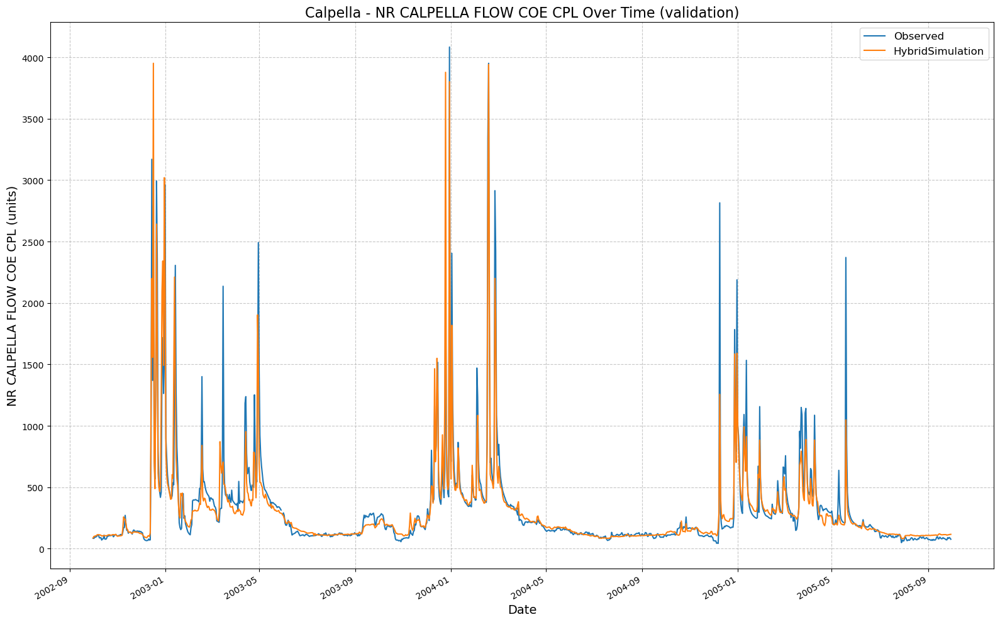

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194327/results_output_validation.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [10]:
if run_gridsearch or not os.path.exists(hyperparam_csv_file):
    for (hs, seq, nl, ep) in itertools.product(
            hyperparam_space["hidden_size"],
            hyperparam_space["seq_length"],
            hyperparam_space["num_layers"],
            hyperparam_space["epochs"]
    ):
        hp = {
            "hidden_size": hs,
            "seq_length": seq,
            "num_layers": nl,
            "epochs": ep,
            "output_dropout": fixed_dropout,
        }
        print(f"Physics: {hp}")
        trainer = UCB_trainer(
            path_to_csv_folder=path_to_csv,
            yaml_path=path_to_yaml,
            hyperparams=hp,
            input_features=features_with_physics,
            physics_informed=True,
            physics_data_file=path_to_physics_data,
            hourly=False,
            extend_train_period=False,
            gpu=-1
        )
        trainer.train()
        csv_path, metrics_dict = trainer.results()
        row_data = {"hidden_size": hs, "seq_length": seq, "num_layers": nl, "epochs": ep, "output_dropout": fixed_dropout}
        for k, v in metrics_dict.items():
            row_data[k] = v
        physics_results.append(row_data)
    df_physics = pd.DataFrame(physics_results)
    df_physics.sort_values(by="NSE", ascending=False, inplace=True)
    df_physics.reset_index(drop=True, inplace=True)
    best_no_phys = df_no_physics.iloc[0].to_dict()
    best_phys = df_physics.iloc[0].to_dict()
    best_no_phys["model_type"] = "no_physics"
    best_phys["model_type"] = "physics"
    best_params_df = pd.DataFrame([best_no_phys, best_phys])
    best_params_df.to_csv(hyperparam_csv_file, index=False)
else:
    print("Skipping Grid-Search")

In [1]:
if run_gridsearch:
    print(df_no_physics.iloc[0:4])
    df_no_physics.to_csv("calpella_daily_no_physics_gridsearch.csv", index=False)

NameError: name 'run_gridsearch' is not defined

In [ ]:
if run_gridsearch:
    print(df_physics.iloc[0:4])
    df_physics.to_csv("calpella_daily_physics_gridsearch.csv", index=False)

In [11]:
if os.path.exists(hyperparam_csv_file):
    best_params_df = pd.read_csv(hyperparam_csv_file)
    best_no_phys = best_params_df.query("model_type == 'no_physics'").iloc[0].to_dict()
    best_phys = best_params_df.query("model_type == 'physics'").iloc[0].to_dict()

    best_no_physics_params = {
        "epochs": int(best_no_phys["epochs"]),
        "hidden_size": int(best_no_phys["hidden_size"]),
        "seq_length": int(best_no_phys["seq_length"]),
        "num_layers": int(best_no_phys["num_layers"]),
        "output_dropout": float(best_no_phys["output_dropout"]),
    }

    best_physics_params = {
        "epochs": int(best_phys["epochs"]),
        "hidden_size": int(best_phys["hidden_size"]),
        "seq_length": int(best_phys["seq_length"]),
        "num_layers": int(best_phys["num_layers"]),
        "output_dropout": float(best_phys["output_dropout"]),
    }

### Re-run validation with best hyperparameters

In [ ]:
lstmNoPhysicsValBest = UCB_trainer(
    path_to_csv_folder=path_to_csv,
    yaml_path=path_to_yaml,
    hyperparams=best_no_physics_params,
    input_features=None,
    physics_informed=False,
    physics_data_file=None,
    hourly=False,
    extend_train_period=False,
    gpu=-1
)
lstmNoPhysicsValBest.train()
no_physics_val_csv, no_physics_val_metrics = lstmNoPhysicsValBest.results()
no_physics_val_metrics

In [ ]:
lstmPhysicsValBest = UCB_trainer(
    path_to_csv_folder=path_to_csv,
    yaml_path=path_to_yaml,
    hyperparams=best_physics_params,
    input_features=features_with_physics,
    physics_informed=True,
    physics_data_file=path_to_physics_data,
    hourly=False,
    extend_train_period=False,
    gpu=-1
)
lstmPhysicsValBest.train()
physics_val_csv, physics_val_metrics = lstmPhysicsValBest.results()
physics_val_metrics

In [ ]:
combinedPlot(
    lstm_results=no_physics_val_csv,
    lstmPhysics_results=physics_val_csv,
    HMS_results=path_to_physics_data,
    title="Calpella Basin Daily Model Comparison (Validation)",
    fName="calpella_daily_val_metrics.csv",
    plot_filename="calpella_daily_val_model_comparison.png"  
)

In [ ]:
fancyCombinedPlot(
    lstm_results=no_physics_val_csv,
    lstmPhysics_results=physics_val_csv,
    HMS_results=path_to_physics_data,  
    title='Calpella Basin Daily Model Comparison (Validation)',
    fName="calpella_daily_val_metrics.csv"
)

### Re-run testing with best hyperparameters

2025-02-16 19:46:06,910: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194606/output.log initialized.
2025-02-16 19:46:06,911: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194606
2025-02-16 19:46:06,911: ### Run configurations for testing_run
2025-02-16 19:46:06,911: experiment_name: testing_run
2025-02-16 19:46:06,912: train_basin_file: calpella
2025-02-16 19:46:06,912: validation_basin_file: calpella
2025-02-16 19:46:06,912: test_basin_file: calpella
2025-02-16 19:46:06,912: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:46:06,913: train_end_date: 2005-09-30 00:00:00
2025-02-16 19:46:06,913: validation_start_date: 2002-10-01 00:00:00
2025-02-16 19:46:06,913: validation_end_date: 2005-09-30 00:00:00
2025-02-16 19:46:06,913: test_start_date: 2005-10-01 00:00:00
2025-02-16 19:46:06,914: test_end_date: 2009-09-29 00:00:00
2025-02-16 19:46:06,914

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]
2025-02-16 19:49:58,553: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194606/validation/model_epoch032/validation_metrics.csv
2025-02-16 19:49:58,555: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194606/validation/model_epoch032/validation_results.p
2025-02-16 19:49:58,562: Using the model weights from /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194606/model_epoch032.pt


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Evaluation: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]
2025-02-16 19:50:00,006: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194606/test/model_epoch032/test_metrics.csv
2025-02-16 19:50:00,007: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194606/test/model_epoch032/test_results.p
got predictions


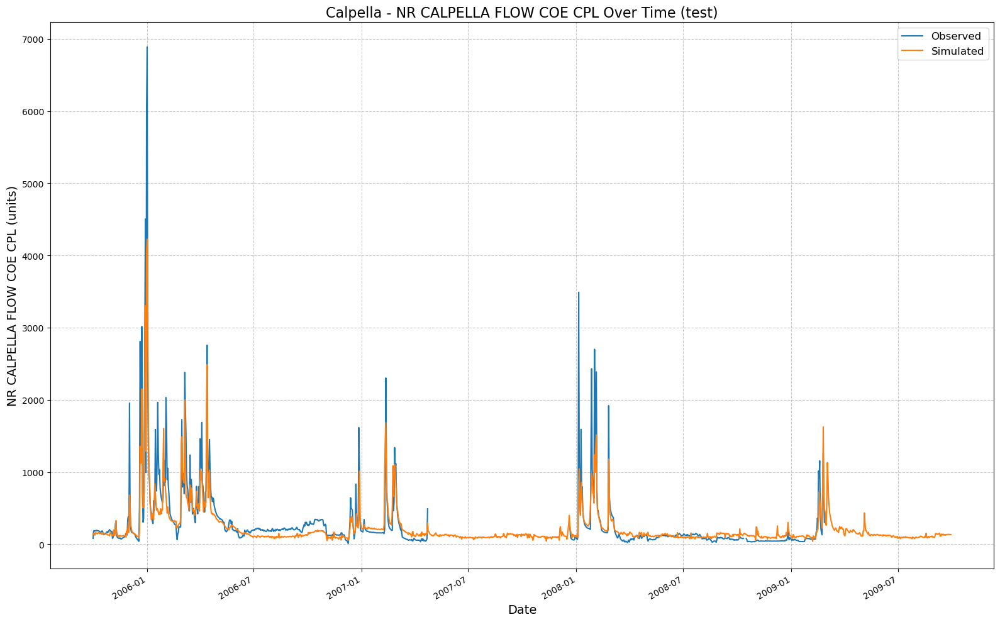

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_194606/results_output_test.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


{'NSE': 0.783271849155426,
 'MSE': 55151.20703125,
 'RMSE': 234.84294119953873,
 'KGE': 0.6799740828793508,
 'Alpha-NSE': 0.7127312395375092,
 'Beta-KGE': 0.8925401568412781,
 'Beta-NSE': -0.06310734322801922,
 'Pearson-r': 0.9086455857686145,
 'FHV': -27.80652344226837,
 'FMS': -22.089440169282696,
 'FLV': 44.677765978488814,
 'Peak-Timing': 0.5,
 'Peak-MAPE': 42.74512767791748}

In [12]:
lstmNoPhysicsExtBest = UCB_trainer(
    path_to_csv_folder=path_to_csv,
    yaml_path=path_to_yaml,
    hyperparams=best_no_physics_params,
    input_features=None,
    physics_informed=False,
    physics_data_file=None,
    hourly=False,
    extend_train_period=True,  
    gpu=-1
)

lstmNoPhysicsExtBest.train()
no_physics_test_csv, no_physics_test_metrics = lstmNoPhysicsExtBest.results('test')
no_physics_test_metrics

2025-02-16 19:50:00,275: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_195000/output.log initialized.
2025-02-16 19:50:00,276: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_195000
2025-02-16 19:50:00,276: ### Run configurations for testing_run
2025-02-16 19:50:00,277: experiment_name: testing_run
2025-02-16 19:50:00,277: train_basin_file: calpella
2025-02-16 19:50:00,278: validation_basin_file: calpella
2025-02-16 19:50:00,278: test_basin_file: calpella
2025-02-16 19:50:00,279: train_start_date: 1994-10-01 00:00:00
2025-02-16 19:50:00,279: train_end_date: 2005-09-30 00:00:00
2025-02-16 19:50:00,280: validation_start_date: 2002-10-01 00:00:00
2025-02-16 19:50:00,280: validation_end_date: 2005-09-30 00:00:00
2025-02-16 19:50:00,281: test_start_date: 2005-10-01 00:00:00
2025-02-16 19:50:00,281: test_end_date: 2009-09-29 00:00:00
2025-02-16 19:50:00,282

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]
2025-02-16 19:50:31,416: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_195000/validation/model_epoch016/validation_metrics.csv
2025-02-16 19:50:31,417: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_195000/validation/model_epoch016/validation_results.p
2025-02-16 19:50:31,425: Using the model weights from /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_195000/model_epoch016.pt


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]
2025-02-16 19:50:32,030: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_195000/test/model_epoch016/test_metrics.csv
2025-02-16 19:50:32,031: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_195000/test/model_epoch016/test_results.p
got predictions


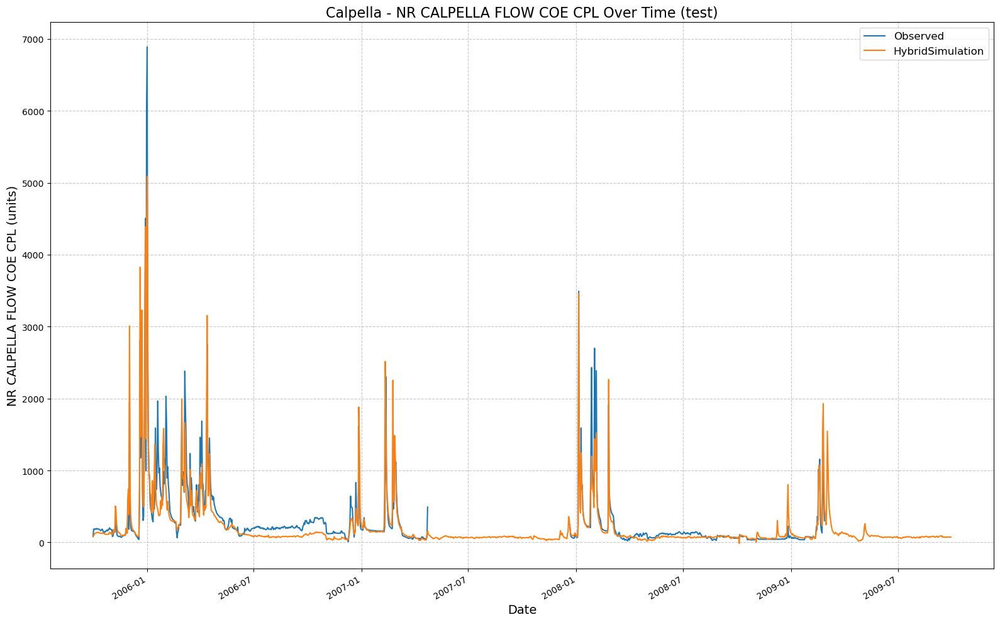

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1602_195000/results_output_test.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


{'NSE': 0.831038311123848,
 'MSE': 42995.9921875,
 'RMSE': 207.35474961403705,
 'KGE': 0.8287953393574978,
 'Alpha-NSE': 0.9259545273248455,
 'Beta-KGE': 0.8712716698646545,
 'Beta-NSE': -0.07559757077530434,
 'Pearson-r': 0.914810089666717,
 'FHV': -3.8478247821331024,
 'FMS': 2.989211561095721,
 'FLV': -981.4962775962713,
 'Peak-Timing': 0.0,
 'Peak-MAPE': 21.939988136291504}

In [13]:
lstmPhysicsExtBest = UCB_trainer(
    path_to_csv_folder=path_to_csv,
    yaml_path=path_to_yaml,
    hyperparams=best_physics_params,
    input_features=features_with_physics,
    physics_informed=True,
    physics_data_file=path_to_physics_data,
    hourly=False,
    extend_train_period=True,
    gpu=-1
)

lstmPhysicsExtBest.train()
physics_test_csv, physics_test_metrics = lstmPhysicsExtBest.results('test')
physics_test_metrics

In [ ]:
combinedPlot(
    lstm_results=no_physics_test_csv,
    lstmPhysics_results=physics_test_csv,
    HMS_results=path_to_physics_data,
    title='Calpella Basin Daily Model Comparison',
    fName = "calpella_daily_metrics.csv",
    plot_filename="calpella_daily_model_comparison.png"
)

In [15]:
fancyCombinedPlot(lstm_results=no_physics_test_csv, lstmPhysics_results= physics_test_csv, HMS_results=path_to_physics_data, title='Calpella Basin Daily Model Comparison', fName = "calpella_daily_metrics.csv")

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.

/Users/canruso/Desktop/UCB

,HMS,LSTM,Physics_Informed_LSTM
NSE,0.699238,0.783272,0.831048
MSE,76535.402184,55151.209458,42993.503561
RMSE,276.650325,234.842946,207.348749
KGE,0.746450,0.679974,0.828826
Alpha-NSE,1.224663,0.712731,0.925938
Beta-KGE,1.058923,0.892540,0.871320
Beta-NSE,0.034604,-0.063107,-0.075569
Pearson-r,0.898302,0.908646,0.914813
FHV,25.593700,-27.806523,-3.847826
FMS,-0.006060,-22.089430,2.989199
